#**Machine Learning : The Quality of Life**
The project aims to identify various infrastructures such as schools, hospitals, historical buildings, pharmacies, universities, cinemas, festival, and more abstract aspects like crime rates and unemployment rate, to ultimately assign a quality-of-life score for each municipality. The goal originally was to train a machine learning model to estimate whether a city, based on its buildings and other criteria, can be expected to provide a good quality of life for its residents.

**Stage 1** : the goal was to try as much models as possible in order to get a good look at the correlation between our datasets. Our target was the column "MED14", which qualifies the quality of life.

**Stage 2** : After a thorough analysis, regarding the quality of data and our results, we chose to predict the number of properties per inhabitants, the average price of housing per square meter and population growth. We are doing this by changing our target column compared to what we wanted to do in stage 1.

In [ ]:
import pandas as pd
from scipy.stats import beta
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, r2_score


#Nettoyage

The first thing we did was cleaning our different datasets. We removed columns that are not necessary for our study from each dataset. And we treated the missing data for certain datasets. Finally, we saved a new clean csv file for each dataset.

##Batiment historique

In [ ]:
df1 = pd.read_csv("zone batiment historique 2015.csv", sep=",", encoding="ISO-8859-1")
df1.head()

<ipython-input-43-621e85e581a9>:1: DtypeWarning: Columns (0,4,6,61,62,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,237,238,241,242,243,244,245,246,247,248,249,250,251,252,253,255) have mixed types. Specify dtype option on import or set low_memory=False.
  df1 = pd.read_csv("zone batiment historique 2015.csv", sep=",", encoding="ISO-8859-1")


,N°,REFERENCE,étude,région,département,Commune,INSEE,Adresse,dénomination,titre courant,...,Unnamed: 246,Unnamed: 247,Unnamed: 248,Unnamed: 249,Unnamed: 250,Unnamed: 251,Unnamed: 252,Unnamed: 253,Unnamed: 254,Unnamed: 255
0,1,PA00132969,recensement immeubles MH,Rhône-Alpes,1,'Abergement-Clémenciat (L'')',1001,NaN,site archéologique,Site médiéval du Vieux Bourg,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,PA00116287,recensement immeubles MH,Rhône-Alpes,1,Amareins-Francheleins-Cesseins,1165,NaN,église,Eglise,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,PA00116291,recensement immeubles MH,Rhône-Alpes,1,Ambronay,1007,Thollon (place),abbaye,Ancienne abbaye dAmbronay,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,PA00125733,recensement immeubles MH,Rhône-Alpes,1,Ambronay,1007,NaN,fort,site archéologique,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,PA00116288,recensement immeubles MH,Rhône-Alpes,1,Ambérieu-en-Bugey,1004,NaN,château,site archéologique,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df12 = df1.drop(['affectataire', 'protection', 'préc. Protection',
       'date protection', 'auteur(s)', 'siècle', 'Adresse','N°', 'REFERENCE', 'étude', 'région', 'département','Unnamed: 17', 'Unnamed: 18', 'Unnamed: 19',
       'Unnamed: 20', 'Unnamed: 21', 'Unnamed: 22', 'Unnamed: 23',
       'Unnamed: 24', 'Unnamed: 25', 'Unnamed: 26', 'Unnamed: 27',
       'Unnamed: 28', 'Unnamed: 29', 'Unnamed: 30', 'Unnamed: 31',
       'Unnamed: 32', 'Unnamed: 33', 'Unnamed: 34', 'Unnamed: 35',
       'Unnamed: 36', 'Unnamed: 37', 'Unnamed: 38', 'Unnamed: 39',
       'Unnamed: 40', 'Unnamed: 41', 'Unnamed: 42', 'Unnamed: 43',
       'Unnamed: 44', 'Unnamed: 45', 'Unnamed: 46', 'Unnamed: 47',
       'Unnamed: 48', 'Unnamed: 49', 'Unnamed: 50', 'Unnamed: 51',
       'Unnamed: 52', 'Unnamed: 53', 'Unnamed: 54', 'Unnamed: 55',
       'Unnamed: 56', 'Unnamed: 57', 'Unnamed: 58', 'Unnamed: 59',
       'Unnamed: 60', 'Unnamed: 61', 'Unnamed: 62', 'Unnamed: 63',
       'Unnamed: 64', 'Unnamed: 65', 'Unnamed: 66', 'Unnamed: 67',
       'Unnamed: 68', 'Unnamed: 69', 'Unnamed: 70', 'Unnamed: 71',
       'Unnamed: 72', 'Unnamed: 73', 'Unnamed: 74', 'Unnamed: 75',
       'Unnamed: 76', 'Unnamed: 77', 'Unnamed: 78', 'Unnamed: 79',
       'Unnamed: 80', 'Unnamed: 81', 'Unnamed: 82', 'Unnamed: 83',
       'Unnamed: 84', 'Unnamed: 85', 'Unnamed: 86', 'Unnamed: 87',
       'Unnamed: 88', 'Unnamed: 89', 'Unnamed: 90', 'Unnamed: 91',
       'Unnamed: 92', 'Unnamed: 93', 'Unnamed: 94', 'Unnamed: 95','Unnamed: 96', 'Unnamed: 97', 'Unnamed: 98', 'Unnamed: 99',
       'Unnamed: 100', 'Unnamed: 101', 'Unnamed: 102', 'Unnamed: 103',
       'Unnamed: 104', 'Unnamed: 105','Unnamed: 106', 'Unnamed: 107', 'Unnamed: 108', 'Unnamed: 109',
       'Unnamed: 110', 'Unnamed: 111', 'Unnamed: 112', 'Unnamed: 113',
       'Unnamed: 114', 'Unnamed: 115','Unnamed: 116', 'Unnamed: 117', 'Unnamed: 118', 'Unnamed: 119',
       'Unnamed: 120', 'Unnamed: 121', 'Unnamed: 122', 'Unnamed: 123',
       'Unnamed: 124', 'Unnamed: 125','Unnamed: 126', 'Unnamed: 127', 'Unnamed: 128', 'Unnamed: 129',
       'Unnamed: 130', 'Unnamed: 131', 'Unnamed: 132', 'Unnamed: 133',
       'Unnamed: 134', 'Unnamed: 135','Unnamed: 136', 'Unnamed: 137', 'Unnamed: 138', 'Unnamed: 139',
       'Unnamed: 140', 'Unnamed: 141', 'Unnamed: 142', 'Unnamed: 143',
       'Unnamed: 144', 'Unnamed: 145','Unnamed: 146', 'Unnamed: 147', 'Unnamed: 148', 'Unnamed: 149',
       'Unnamed: 150', 'Unnamed: 151', 'Unnamed: 152', 'Unnamed: 153',
       'Unnamed: 154', 'Unnamed: 155','Unnamed: 156', 'Unnamed: 157', 'Unnamed: 158', 'Unnamed: 159',
       'Unnamed: 160', 'Unnamed: 161', 'Unnamed: 162', 'Unnamed: 163',
       'Unnamed: 164', 'Unnamed: 165','Unnamed: 166', 'Unnamed: 167', 'Unnamed: 168', 'Unnamed: 169',
       'Unnamed: 170', 'Unnamed: 171', 'Unnamed: 172', 'Unnamed: 173',
       'Unnamed: 174', 'Unnamed: 175','Unnamed: 176', 'Unnamed: 177', 'Unnamed: 178', 'Unnamed: 179',
       'Unnamed: 180', 'Unnamed: 181', 'Unnamed: 182', 'Unnamed: 183',
       'Unnamed: 184', 'Unnamed: 185','Unnamed: 186', 'Unnamed: 187', 'Unnamed: 188', 'Unnamed: 189',
       'Unnamed: 190', 'Unnamed: 191', 'Unnamed: 192', 'Unnamed: 193',
       'Unnamed: 194', 'Unnamed: 195','Unnamed: 196', 'Unnamed: 197', 'Unnamed: 198', 'Unnamed: 199',
       'Unnamed: 200', 'Unnamed: 201', 'Unnamed: 202', 'Unnamed: 203',
       'Unnamed: 204', 'Unnamed: 205','Unnamed: 206', 'Unnamed: 207', 'Unnamed: 208', 'Unnamed: 209',
       'Unnamed: 210', 'Unnamed: 211', 'Unnamed: 212', 'Unnamed: 213',
       'Unnamed: 214', 'Unnamed: 215','Unnamed: 216', 'Unnamed: 217', 'Unnamed: 218', 'Unnamed: 219',
       'Unnamed: 220', 'Unnamed: 221', 'Unnamed: 222', 'Unnamed: 223',
       'Unnamed: 224', 'Unnamed: 225','Unnamed: 226', 'Unnamed: 227', 'Unnamed: 228', 'Unnamed: 229',
       'Unnamed: 230', 'Unnamed: 231', 'Unnamed: 232', 'Unnamed: 233',
       'Unnamed: 234', 'Unnamed: 235','Unnamed: 236', 'Unnamed: 237', 'Unnamed: 238', 'Unnamed: 239',
       'Unnamed: 240', 'Unnamed: 241', 'Unnamed: 242', 'Unnamed: 243',
       'Unnamed: 244', 'Unnamed: 245','Unnamed: 246', 'Unnamed: 247', 'Unnamed: 248', 'Unnamed: 249',
       'Unnamed: 250', 'Unnamed: 251', 'Unnamed: 252', 'Unnamed: 253',
       'Unnamed: 254', 'Unnamed: 255'], axis=1)

df12.to_csv('batiment_historique_finale.csv')

##Crime et délit

In [ ]:
df3 = pd.read_parquet("donnee-comm-data.gouv-parquet-2023-geographie2024-produit-le2024-07-05.parquet")
df3.head()

,CODGEO_2024,annee,classe,unité.de.compte,valeur.publiée,faits,tauxpourmille,complementinfoval,complementinfotaux,POP,millPOP,LOG,millLOG
0,01001,16,Coups et blessures volontaires,victime,ndiff,NaN,NaN,1.698925,1.498563,767,16,348.0,16
1,01001,16,Coups et blessures volontaires intrafamiliaux,victime,diff,0.0,0.0,NaN,NaN,767,16,348.0,16
2,01001,16,Autres coups et blessures volontaires,victime,ndiff,NaN,NaN,1.511628,0.926155,767,16,348.0,16
3,01001,16,Violences sexuelles,victime,diff,0.0,0.0,NaN,NaN,767,16,348.0,16
4,01001,16,Vols avec armes,infraction,diff,0.0,0.0,NaN,NaN,767,16,348.0,16


In [ ]:
df32 = df3.drop(['annee','valeur.publiée',
       'faits', 'tauxpourmille', 'complementinfoval', 'complementinfotaux',
       'POP', 'millPOP', 'LOG', 'millLOG'], axis = 1)
df32.to_csv('crime_delit.csv')

##Hopitaux

In [ ]:
df5 = pd.read_csv("fichier_hopitaux.csv")
df5.head()

<ipython-input-47-dcd464753eed>:1: DtypeWarning: Columns (18,26,28,71) have mixed types. Specify dtype option on import or set low_memory=False.
  df5 = pd.read_csv("fichier_hopitaux.csv")


,siren,nic,siret,statutDiffusionEtablissement,dateCreationEtablissement,trancheEffectifsEtablissement,anneeEffectifsEtablissement,activitePrincipaleRegistreMetiersEtablissement,dateDernierTraitementEtablissement,etablissementSiege,...,codePaysEtranger2Etablissement,libellePaysEtranger2Etablissement,etatAdministratifEtablissement,enseigne1Etablissement,enseigne2Etablissement,enseigne3Etablissement,denominationUsuelleEtablissement,activitePrincipaleEtablissement,nomenclatureActivitePrincipaleEtablissement,caractereEmployeurEtablissement
0,5720164,28,572016400028,O,1983-09-28,22,2019.0,NaN,2021-10-27T08:00:29,True,...,NaN,NaN,A,NaN,NaN,NaN,NaN,86.10Z,NAFRev2,O
1,7050040,18,705004000018,O,1970-01-01,22,2019.0,NaN,2021-10-27T08:00:30,True,...,NaN,NaN,A,NaN,NaN,NaN,NaN,86.10Z,NAFRev2,O
2,17150533,10,1715053300010,O,1971-01-01,22,2019.0,NaN,2021-10-27T08:00:38,True,...,NaN,NaN,A,NaN,NaN,NaN,NaN,86.10Z,NAFRev2,O
3,36220150,27,3622015000027,O,1997-01-27,21,2019.0,NaN,2022-04-14T04:02:36,True,...,NaN,NaN,A,NaN,NaN,NaN,POLE ANTIBES SAINT JEAN,86.10Z,NAFRev2,O
4,46620241,11,4662024100011,O,1966-01-01,12,2019.0,NaN,2022-05-19T04:02:10,True,...,NaN,NaN,A,NaN,NaN,NaN,NaN,86.10Z,NAFRev2,O


In [ ]:
df52 = df5.drop(['siren', 'nic', 'siret', 'statutDiffusionEtablissement',
       'dateCreationEtablissement', 'trancheEffectifsEtablissement',
       'anneeEffectifsEtablissement',
       'activitePrincipaleRegistreMetiersEtablissement',
       'dateDernierTraitementEtablissement', 'etablissementSiege','etatAdministratifUniteLegale', 'statutDiffusionUniteLegale',
       'unitePurgeeUniteLegale', 'dateCreationUniteLegale',
       'categorieJuridiqueUniteLegale',       'sigleUniteLegale', 'denominationUsuelle1UniteLegale',
       'denominationUsuelle2UniteLegale', 'denominationUsuelle3UniteLegale',
       'sexeUniteLegale', 'nomUniteLegale', 'nomUsageUniteLegale',
       'prenom1UniteLegale', 'prenom2UniteLegale', 'prenom3UniteLegale',
       'prenom4UniteLegale', 'prenomUsuelUniteLegale', 'pseudonymeUniteLegale','activitePrincipaleUniteLegale',
       'nomenclatureActivitePrincipaleUniteLegale',
       'identifiantAssociationUniteLegale',
       'economieSocialeSolidaireUniteLegale', 'caractereEmployeurUniteLegale',
       'trancheEffectifsUniteLegale', 'anneeEffectifsUniteLegale',
       'nicSiegeUniteLegale', 'dateDernierTraitementUniteLegale', 'categorieEntreprise', 'anneeCategorieEntreprise',
       'complementAdresseEtablissement', 'numeroVoieEtablissement',
       'indiceRepetitionEtablissement', 'typeVoieEtablissement',
       'libelleVoieEtablissement', 'libelleCommuneEtrangerEtablissement',
       'distributionSpecialeEtablissement','codeCedexEtablissement', 'libelleCedexEtablissement',
       'codePaysEtrangerEtablissement', 'libellePaysEtrangerEtablissement',
       'complementAdresse2Etablissement', 'numeroVoie2Etablissement',
       'indiceRepetition2Etablissement', 'typeVoie2Etablissement',
       'libelleVoie2Etablissement', 'codePostal2Etablissement',
       'libelleCommune2Etablissement', 'libelleCommuneEtranger2Etablissement',
       'distributionSpeciale2Etablissement', 'codeCommune2Etablissement',
       'codeCedex2Etablissement', 'libelleCedex2Etablissement',
       'codePaysEtranger2Etablissement', 'libellePaysEtranger2Etablissement',
       'etatAdministratifEtablissement', 'enseigne1Etablissement',
       'enseigne2Etablissement', 'enseigne3Etablissement',
       'denominationUsuelleEtablissement', 'activitePrincipaleEtablissement',
       'nomenclatureActivitePrincipaleEtablissement',
       'caractereEmployeurEtablissement' ], axis=1)

df52.to_csv('hopitaux.csv')

##Ecole

In [ ]:
df6 = pd.read_csv("fr-en-adresse-et-geolocalisation-etablissements-premier-et-second-degre.csv", sep=';', encoding='utf-8')
df6.head()

<ipython-input-49-f92bd4eeea22>:1: DtypeWarning: Columns (22,25) have mixed types. Specify dtype option on import or set low_memory=False.
  df6 = pd.read_csv("fr-en-adresse-et-geolocalisation-etablissements-premier-et-second-degre.csv", sep=';', encoding='utf-8')


,numero_uai,appellation_officielle,denomination_principale,patronyme_uai,secteur_public_prive_libe,adresse_uai,lieu_dit_uai,boite_postale_uai,code_postal_uai,localite_acheminement_uai,...,code_commune,libelle_departement,libelle_region,libelle_academie,position,secteur_prive_code_type_contrat,secteur_prive_libelle_type_contrat,code_ministere,libelle_ministere,date_ouverture
0,0280132S,Ecole primaire Jean Lelievre,ECOLE PRIMAIRE PUBLIQUE,JEAN LELIEVRE,Public,1 rue de l'Eglise,NaN,NaN,28500,MARVILLE MOUTIERS BRULE,...,28239,Eure-et-Loir,Centre-Val de Loire,Orléans-Tours,"48.675859467641374, 1.3915955785995753",99.0,SANS OBJET,6,MINISTERE DE L'EDUCATION NATIONALE,1967-02-08
1,0280140A,Ecole primaire,ECOLE PRIMAIRE,TREON,Public,4 rue Lucien Rialet,NaN,NaN,28500,TREON,...,28394,Eure-et-Loir,Centre-Val de Loire,Orléans-Tours,"48.677196333593336, 1.3264305550807276",99.0,SANS OBJET,6,MINISTERE DE L'EDUCATION NATIONALE,1967-02-08
2,0280146G,Ecole élémentaire Louis Pergaud,ECOLE ELEMENTAIRE PUBLIQUE,LOUIS PERGAUD,Public,1 rue de l'Epinay,NaN,NaN,28500,VERNOUILLET,...,28404,Eure-et-Loir,Centre-Val de Loire,Orléans-Tours,"48.725453828248966, 1.3319293827210517",99.0,SANS OBJET,6,MINISTERE DE L'EDUCATION NATIONALE,1967-02-08
3,0280155S,Ecole primaire,ECOLE PRIMAIRE PUBLIQUE,BOISVILLE-LA-SAINT-PERE-ALLONES,Public,1 rue du Stade,NaN,NaN,28150,BOISVILLE LA ST PERE,...,28047,Eure-et-Loir,Centre-Val de Loire,Orléans-Tours,"48.32728348160609, 1.6946294598047125",99.0,SANS OBJET,6,MINISTERE DE L'EDUCATION NATIONALE,1967-02-07
4,0280162Z,Ecole primaire,ECOLE PRIMAIRE PUBLIQUE,NaN,Public,3 rue de la République,NaN,NaN,28150,OUARVILLE,...,28291,Eure-et-Loir,Centre-Val de Loire,Orléans-Tours,"48.35397582025789, 1.7785743335767488",99.0,SANS OBJET,6,MINISTERE DE L'EDUCATION NATIONALE,1967-02-07


In [ ]:
df62 = df6.drop(['numero_uai','lieu_dit_uai','boite_postale_uai','secteur_public_prive_libe','etat_etablissement','coordonnee_x',
       'coordonnee_y', 'EPSG', 'latitude', 'longitude', 'appariement',
       'localisation', 'nature_uai','etat_etablissement_libe', 'code_departement', 'code_region',
       'code_academie','libelle_departement',
       'libelle_region', 'libelle_academie','position',
       'secteur_prive_code_type_contrat', 'secteur_prive_libelle_type_contrat',
       'code_ministere', 'libelle_ministere', 'date_ouverture' ], axis=1)

df62.to_csv('école_premier_seconde_deg.csv')

##Population


In [ ]:
df_pop = pd.read_csv("base-cc-evol-struct-pop-2021.CSV", sep = ";")
df_pop.head()

<ipython-input-51-4528f3a46e66>:1: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df_pop = pd.read_csv("base-cc-evol-struct-pop-2021.CSV", sep = ";")


,CODGEO,P21_POP,P21_POP0014,P21_POP1529,P21_POP3044,P21_POP4559,P21_POP6074,P21_POP7589,P21_POP90P,P21_POPH,...,C10_POP2554_CS8,C10_POP55P,C10_POP55P_CS1,C10_POP55P_CS2,C10_POP55P_CS3,C10_POP55P_CS4,C10_POP55P_CS5,C10_POP55P_CS6,C10_POP55P_CS7,C10_POP55P_CS8
0,1001,832.0,158.552045,100.025669,152.787222,198.071134,149.720218,67.098389,5.745324,423.485017,...,0.000000,225.148718,0.0,0.000000,16.082051,4.020513,20.102564,12.061538,164.841026,8.041026
1,1002,267.0,57.046286,32.439093,57.272224,58.101506,40.504740,19.768434,1.867717,139.890359,...,7.555556,68.000000,0.0,0.000000,0.000000,0.000000,0.000000,7.555556,60.444444,0.000000
2,1004,14854.0,2789.758194,3081.375266,2740.192625,2632.565876,2269.033228,1152.137702,188.937109,7125.780104,...,538.066904,3477.141561,0.0,65.560548,69.417225,137.972930,136.692417,136.554034,2673.140809,257.803598
3,1005,1897.0,367.334805,289.213773,388.963943,415.518703,301.217072,123.672440,11.079265,950.047549,...,28.000000,392.000000,0.0,8.000000,8.000000,8.000000,8.000000,12.000000,316.000000,32.000000
4,1006,113.0,9.912281,13.877193,19.824561,23.789474,37.666667,7.929825,0.000000,59.473684,...,8.285714,53.857143,0.0,0.000000,0.000000,8.285714,8.285714,0.000000,37.285714,0.000000


In [ ]:
df_pop2 = df_pop.drop(['P21_POPH',
       'P21_H0014', 'P21_H1529', 'P21_H3044', 'P21_H4559', 'P21_H6074',
       'P21_H7589', 'P21_H90P', 'P21_H0019', 'P21_H2064', 'P21_H65P',
       'P21_POPF', 'P21_F0014', 'P21_F1529', 'P21_F3044', 'P21_F4559',
       'P21_F6074', 'P21_F7589', 'P21_F90P', 'P21_F0019', 'P21_F2064',
       'P21_F65P', 'P21_POP01P', 'P21_POP01P_IRAN1', 'P21_POP01P_IRAN2',
       'P21_POP01P_IRAN3', 'P21_POP01P_IRAN4', 'P21_POP01P_IRAN5',
       'P21_POP01P_IRAN6', 'P21_POP01P_IRAN7', 'P21_POP0114_IRAN2P',
       'P21_POP0114_IRAN2', 'P21_POP0114_IRAN3P', 'P21_POP1524_IRAN2P',
       'P21_POP1524_IRAN2', 'P21_POP1524_IRAN3P', 'P21_POP2554_IRAN2P',
       'P21_POP2554_IRAN2', 'P21_POP2554_IRAN3P', 'P21_POP55P_IRAN2P',
       'P21_POP55P_IRAN2', 'P21_POP55P_IRAN3P', 'C21_POP15P', 'C21_POP15P_CS1',
       'C21_POP15P_CS2', 'C21_POP15P_CS3', 'C21_POP15P_CS4', 'C21_POP15P_CS5',
       'C21_POP15P_CS6', 'C21_POP15P_CS7', 'C21_POP15P_CS8', 'C21_H15P',
       'C21_H15P_CS1', 'C21_H15P_CS2', 'C21_H15P_CS3', 'C21_H15P_CS4',
       'C21_H15P_CS5', 'C21_H15P_CS6', 'C21_H15P_CS7', 'C21_H15P_CS8',
       'C21_F15P', 'C21_F15P_CS1', 'C21_F15P_CS2', 'C21_F15P_CS3',
       'C21_F15P_CS4', 'C21_F15P_CS5', 'C21_F15P_CS6', 'C21_F15P_CS7',
       'C21_F15P_CS8', 'C21_POP1524', 'C21_POP1524_CS1', 'C21_POP1524_CS2',
       'C21_POP1524_CS3', 'C21_POP1524_CS4', 'C21_POP1524_CS5',
       'C21_POP1524_CS6', 'C21_POP1524_CS7', 'C21_POP1524_CS8', 'C21_POP2554',
       'C21_POP2554_CS1', 'C21_POP2554_CS2', 'C21_POP2554_CS3',
       'C21_POP2554_CS4','C21_POP2554_CS5', 'C21_POP2554_CS6', 'C21_POP2554_CS7',
       'C21_POP2554_CS8', 'C21_POP55P', 'C21_POP55P_CS1', 'C21_POP55P_CS2',
       'C21_POP55P_CS3', 'C21_POP55P_CS4', 'C21_POP55P_CS5','C21_POP55P_CS6', 'C21_POP55P_CS7', 'C21_POP55P_CS8', 'P15_POP',
       'P15_POP0014', 'P15_POP1529', 'P15_POP3044', 'P15_POP4559',
       'P15_POP6074', 'P15_POP7589','P15_POP90P', 'P15_POPH', 'P15_H0014', 'P15_H1529', 'P15_H3044',
       'P15_H4559', 'P15_H6074', 'P15_H7589', 'P15_H90P', 'P15_H0019','P15_H2064', 'P15_H65P', 'P15_POPF', 'P15_F0014', 'P15_F1529',
       'P15_F3044', 'P15_F4559', 'P15_F6074', 'P15_F7589', 'P15_F90P','P15_F0019', 'P15_F2064', 'P15_F65P', 'P15_POP01P', 'P15_POP01P_IRAN1',
       'P15_POP01P_IRAN2', 'P15_POP01P_IRAN3', 'P15_POP01P_IRAN4',
       'P15_POP01P_IRAN5', 'P15_POP01P_IRAN6','P15_POP01P_IRAN7', 'P15_POP0114_IRAN2P', 'P15_POP0114_IRAN2',
       'P15_POP0114_IRAN3P', 'P15_POP1524_IRAN2P', 'P15_POP1524_IRAN2',
       'P15_POP1524_IRAN3P', 'P15_POP2554_IRAN2P', 'P15_POP2554_IRAN2',
       'P15_POP2554_IRAN3P','P15_POP55P_IRAN2P', 'P15_POP55P_IRAN2', 'P15_POP55P_IRAN3P',
       'C15_POP15P', 'C15_POP15P_CS1', 'C15_POP15P_CS2', 'C15_POP15P_CS3',
       'C15_POP15P_CS4', 'C15_POP15P_CS5', 'C15_POP15P_CS6','C15_POP15P_CS7', 'C15_POP15P_CS8', 'C15_H15P', 'C15_H15P_CS1',
       'C15_H15P_CS2', 'C15_H15P_CS3', 'C15_H15P_CS4', 'C15_H15P_CS5',
       'C15_H15P_CS6', 'C15_H15P_CS7','C15_H15P_CS8', 'C15_F15P', 'C15_F15P_CS1', 'C15_F15P_CS2',
       'C15_F15P_CS3', 'C15_F15P_CS4', 'C15_F15P_CS5', 'C15_F15P_CS6',
       'C15_F15P_CS7', 'C15_F15P_CS8','C15_POP1524', 'C15_POP1524_CS1', 'C15_POP1524_CS2', 'C15_POP1524_CS3',
       'C15_POP1524_CS4', 'C15_POP1524_CS5', 'C15_POP1524_CS6',
       'C15_POP1524_CS7', 'C15_POP1524_CS8', 'C15_POP2554','C15_POP2554_CS1', 'C15_POP2554_CS2', 'C15_POP2554_CS3',
       'C15_POP2554_CS4', 'C15_POP2554_CS5', 'C15_POP2554_CS6',
       'C15_POP2554_CS7', 'C15_POP2554_CS8', 'C15_POP55P', 'C15_POP55P_CS1','C15_POP55P_CS2', 'C15_POP55P_CS3', 'C15_POP55P_CS4', 'C15_POP55P_CS5',
       'C15_POP55P_CS6', 'C15_POP55P_CS7', 'C15_POP55P_CS8', 'P10_POP',
       'P10_POP0014', 'P10_POP1529','P10_POP3044', 'P10_POP4559', 'P10_POP6074', 'P10_POP75P', 'P10_POPH',
       'P10_H0014', 'P10_H1529', 'P10_H3044', 'P10_H4559', 'P10_H6074','P10_H7589', 'P10_H90P', 'P10_H0019', 'P10_H2064', 'P10_H65P',
       'P10_POPF', 'P10_F0014', 'P10_F1529', 'P10_F3044', 'P10_F4559','P10_F6074', 'P10_F7589', 'P10_F90P', 'P10_F0019', 'P10_F2064',
       'P10_F65P', 'C10_POP15P', 'C10_POP15P_CS1', 'C10_POP15P_CS2',
       'C10_POP15P_CS3','C10_POP15P_CS4', 'C10_POP15P_CS5', 'C10_POP15P_CS6', 'C10_POP15P_CS7',
       'C10_POP15P_CS8', 'C10_H15P', 'C10_H15P_CS1', 'C10_H15P_CS2',
       'C10_H15P_CS3', 'C10_H15P_CS4','C10_H15P_CS5', 'C10_H15P_CS6', 'C10_H15P_CS7', 'C10_H15P_CS8',
       'C10_F15P', 'C10_F15P_CS1', 'C10_F15P_CS2', 'C10_F15P_CS3',
       'C10_F15P_CS4', 'C10_F15P_CS5','C10_F15P_CS6', 'C10_F15P_CS7', 'C10_F15P_CS8', 'C10_POP1524',
       'C10_POP1524_CS1', 'C10_POP1524_CS2', 'C10_POP1524_CS3',
       'C10_POP1524_CS4', 'C10_POP1524_CS5', 'C10_POP1524_CS6','C10_POP1524_CS7', 'C10_POP1524_CS8', 'C10_POP2554', 'C10_POP2554_CS1',
       'C10_POP2554_CS2', 'C10_POP2554_CS3', 'C10_POP2554_CS4',
       'C10_POP2554_CS5', 'C10_POP2554_CS6', 'C10_POP2554_CS7','C10_POP2554_CS8', 'C10_POP55P', 'C10_POP55P_CS1', 'C10_POP55P_CS2',
       'C10_POP55P_CS3', 'C10_POP55P_CS4', 'C10_POP55P_CS5', 'C10_POP55P_CS6',
       'C10_POP55P_CS7', 'C10_POP55P_CS8'], axis = 1)

#P21_POP : population en 2021
#P21_POP0014 : Nombre de personnes de 0 à 14 ans en 2021
#P21_POP1529 : Nombre de personnes de 15 à 29 ans en 2021
#P21_POP3044 : Nombre de personnes de 30 à 44 ans en 2021
#P21_POP4559 : Nombre de personnes de 45 à 59 ans en 2021
#P21_POP6074 : Nombre de personnes de 60 à 74 ans en 2021
#P21_POP7589 : Nombre de personnes de 75 à 89 ans en 2021
#P21_POP90P : Nombre de personnes de 90 ans ou plus en 2021

In [ ]:
df_pop2

,CODGEO,P21_POP,P21_POP0014,P21_POP1529,P21_POP3044,P21_POP4559,P21_POP6074,P21_POP7589,P21_POP90P
0,1001,832.0,158.552045,100.025669,152.787222,198.071134,149.720218,67.098389,5.745324
1,1002,267.0,57.046286,32.439093,57.272224,58.101506,40.504740,19.768434,1.867717
2,1004,14854.0,2789.758194,3081.375266,2740.192625,2632.565876,2269.033228,1152.137702,188.937109
3,1005,1897.0,367.334805,289.213773,388.963943,415.518703,301.217072,123.672440,11.079265
4,1006,113.0,9.912281,13.877193,19.824561,23.789474,37.666667,7.929825,0.000000
...,...,...,...,...,...,...,...,...,...
34958,97420,24293.0,5564.329899,4853.335481,4556.391863,5370.832301,2864.635451,997.155641,86.319364
34959,97421,7243.0,1700.208360,1326.662599,1298.668993,1620.251575,896.342643,371.422147,29.443683
34960,97422,81943.0,18285.741483,16318.584869,15214.365223,16589.370571,11142.902995,4009.875265,382.159595
34961,97423,6899.0,1342.305384,1253.046383,1257.043099,1694.133409,950.602949,352.302838,49.565938


In [ ]:
df_pop2.to_csv('population par commune.csv')

##Activité économique

In [ ]:
df_eco = pd.read_excel('MDB-INSEE-V2.xls')
df_eco = df_eco.drop(['Orientation Economique','SEG Croissance POP','LIBGEO','Dynamique Démographique BV','Environnement Démographique', 'Fidélité', 'SYN MEDICAL',
       'Seg Cap Fiscale', 'Seg Dyn Entre', 'DYN SetC', 'CP',"Urbanité Ruralité", 'REG', 'DEP','Population', 'Nb Femme', 'Nb Homme', 'Nb Mineurs', 'Nb Majeurs',
       'Nb Etudiants',
       'Moyenne Revenus Fiscaux Départementaux',
       'Moyenne Revenus Fiscaux Régionaux',
       'Score VA Région', 'Score PIB',
       'PIB Régionnal', 'SEG Environnement Démographique Obsolète',
       'Capacité Fisc', 'Moyenne Revnus fiscaux', 'Capacité Camping',
       'Taux étudiants', 'Capacité Hotel', 'Nb Atifs', 'Nb Actifs Salariés',
       'Nb Actifs Non Salariés',
       'Dep Moyenne Salaires Horaires', 'Dep Moyenne Salaires Cadre Horaires',
       'Dep Moyenne Salaires Prof Intermédiaire Horaires',
       'Dep Moyenne Salaires Employé Horaires',
       'Dep Moyenne Salaires Ouvrié Horaires', 'Reg Moyenne Salaires Horaires',
       'Reg Moyenne Salaires Cadre Horaires',
       'Reg Moyenne Salaires Prof Intermédiaire Horaires',
       'Reg Moyenne Salaires Employé Horaires',
       'Reg Moyenne Salaires Ouvrié Horaires', 'Valeur ajoutée régionale', 'Evolution Population', 'Score équipement de santé BV',
        'Score Démographique',  'Score Ménages', 'Indice Fiscal Partiel', 'Score Fiscal',
       'Indice Evasion Client', 'Score Evasion Client',
       'Score Synergie Médicale', 'Nb Pharmacies et parfumerie',
       'Nb Occupants Résidence Principale', 'Score Urbanité',
       'Taux Evasion Client',
       'Nb Industries des biens intermédiaires'], axis = 1)
df_eco.to_csv('activité economique par commune.csv')

WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


In [ ]:
df_eco

,CODGEO,Dynamique Entrepreneuriale,Dynamique Entrepreneuriale Service et Commerce,Synergie Médicale COMMUNE,Indice Synergie Médicale,Nb Omnipraticiens BV,Nb Infirmiers Libéraux BV,Nb dentistes Libéraux BV,Nb pharmaciens Libéraux BV,Densité Médicale BV,...,Dynamique Démographique INSEE,Capacité Fiscale,"Nb Education, santé, action sociale",Nb Services personnels et domestiques,"Nb Santé, action sociale",Nb de Commerce,Nb de Services aux particuliers,"Nb institution de Education, santé, action sociale, administration",Score Croissance Population,Score Croissance Entrepreneuriale
0,01001,57.0,23.0,114,114.56713,9,14,7,7,0.092860,...,-1,117,3.0,1.0,0.0,9350,3372,15105,72.13115,0.01585
1,01002,45.0,4.0,143,143.71141,31,36,18,18,0.099229,...,0,110,0.0,0.0,0.0,9350,3372,15105,72.13115,0.00173
2,01004,634.0,828.0,366,367.82080,31,36,18,18,0.099229,...,-55,250,113.0,41.0,118.0,9350,3372,15105,72.95082,0.38471
3,01005,113.0,62.0,132,132.65668,12,12,6,6,1.000000,...,-3,127,5.0,2.0,7.0,9350,3372,15105,72.13115,0.02824
4,01006,42.0,1.0,121,121.60196,26,21,10,10,0.100905,...,0,109,0.0,0.0,0.0,9350,3372,15105,67.62295,0.00000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36672,97420,657.0,534.0,186,186.92533,12,12,6,6,1.000000,...,-265,194,69.0,13.0,66.0,574,117,1102,76.22951,0.43688
36673,97421,228.0,212.0,91,91.45271,12,12,6,6,1.000000,...,-117,104,25.0,1.0,29.0,574,117,1102,76.63934,0.13083
36674,97422,2689.0,2586.0,837,841.16396,12,12,6,6,1.000000,...,-734,-512,334.0,116.0,301.0,574,117,1102,75.40984,2.09129
36675,97423,222.0,210.0,88,88.43779,12,12,6,6,1.000000,...,-88,102,32.0,5.0,30.0,574,117,1102,75.81967,0.10547


##Cinemas

In [ ]:
data_cine = pd.read_excel('https://www.data.gouv.fr/fr/datasets/r/cdb918e7-7f1a-44fc-bf6f-c59d1614ed6d', sheet_name = "2023")
data_cine.drop(index= [0,1,2], errors = 'ignore', inplace = True)
data_cine.columns = data_cine.iloc[0]
data_cine = data_cine[1:]
data_cine = data_cine.reset_index(drop=True)
data_cine["DEPCOM"] = data_cine["DEPCOM"].astype(str).str.strip()
data_cine.to_csv('data_cine_finale.csv')
data_cine.head()

3,NAutoC,NomEtab,Ecrans,fauteuils,DEPCOM,COMMUNE,genre,AE,3D
0,31,UGC NORMANDIE,4,1533,75108,Paris 8e Arrondissement,FIXE,NON,OUI
1,35,BALZAC,3,589,75108,Paris 8e Arrondissement,FIXE,OUI,OUI
2,54,GAUMONT CHAMPS ELYSEES MARIGNAN,6,1597,75108,Paris 8e Arrondissement,FIXE,NON,NON
3,55,ELYSEES LINCOLN,3,448,75108,Paris 8e Arrondissement,FIXE,OUI,NON
4,204,UGC OPERA,4,722,75109,Paris 9e Arrondissement,FIXE,NON,NON


##Museums

In [ ]:
data_muse = pd.read_csv(
    "https://data.culture.gouv.fr/api/explore/v2.1/catalog/datasets/musees-de-france-base-museofile/exports/csv?use_labels=true",
    on_bad_lines='skip',
    sep = ';'
)
data_muse.dropna(axis=1, how='all', inplace=False)
data_muse.to_csv('data_muse_finale.csv')
data_muse.head()

,Identifiant,Nom_officiel,Adresse,Lieu,Code_postal,Ville,Région,Departement,URL,Telephone,...,Thèmes,Artiste,Personnage_phare,Intérêt,Protection_batiment,Protection_espace,Refmer,Annee_creation,Date_de_mise_a_jour,Coordonnees
0,M0001,musée de la Folie Marco,30 rue du docteur Sultzer,NaN,67140,Barr,Grand Est,Bas-Rhin,www.musee-foliemarco.com,03 88 08 94 72,...,"Arts décoratifs : Mobilier, Objets d'art",NaN,NaN,Demeure patricienne d'architecture française d...,Protégé au titre des Monuments historiques : h...,Abords d'un Monument historique. Site inscrit.,PA00084599;IA00115077,1960,2024-01-25,"48.410166, 7.451102"
1,M0031,musée historique,64 rue du général de Gaulle,NaN,68240,Kaysersberg,Grand Est,Haut-Rhin,www.kaysersberg-vignoble.fr/musee-historique,03 89 78 11 11,...,Archéologie nationale : Protohistoire;Art reli...,NaN,NaN,Maison patricienne construite en 1521 par René...,Protégé au titre des Monuments historiques : h...,Site inscrit.,PA00085485;IA68000639,NaN,2024-01-25,"48.139072, 7.261441"
2,M0036,musée Français du Chemin de Fer,2 rue Alfred de Glehn,NaN,68200,Mulhouse,Grand Est,Haut-Rhin,www.citedutrain.com/,03 89 42 83 33 / 25 67,...,"Beaux-Arts : Dessin, Estampe et Affiche, Peint...",NaN,NaN,NaN,NaN,Site patrimonial remarquable.,SPR4400043;SPR4400044,1971,2024-01-25,"47.732372, 7.312824"
3,M0038,musée du Sapeur-Pompier,12-14 rue de Luppach,NaN,68480,Vieux-Ferrette,Grand Est,Haut-Rhin,www.musee-sapeur-pompier.fr/,06 11 68 75 13,...,"Autre(s), (Sapeurs-pompiers),",NaN,NaN,NaN,NaN,NaN,NaN,NaN,2024-02-07,"47.504301, 7.304287"
4,M0041,musée Paysan,10 rue principale,NaN,68480,Oltingue,Grand Est,Haut-Rhin,musee.paysan.free.fr/,03 89 40 79 24,...,Art religieux (Art chrétien);Ethnologie : Cost...,NaN,NaN,Maison du XVI - XVIIe siècles. Rez-de-chaussée...,NaN,NaN,NaN,NaN,2024-02-07,"47.492827, 7.391275"


##Festivals

In [ ]:
data_festivals = pd.read_csv("panorama-des-festivals.csv", on_bad_lines = 'skip', sep = ';')
data_festivals.to_csv('data_festivals_finale.csv')
data_festivals.head()

,Nom de la manifestation,Région,Domaine,Complément domaine,Département,Périodicité,Mois habituel de début,Site web,N° Identification,Commune principale,...,Commentaires,N° de l'édition 2019,Check édition,"Mois indicatif en chiffre, y compris double mois",Mois indicatif,Date début ancien,Date de fin ancien,Soutien 2017 MCC à la structure,Part festival sur soutien à la structure,Enquête DRAC 2017
0,FESTIVAL LES VAGAMONDES,Grand Est,Transdisciplinaire,NaN,68,Annuelle,01 (janvier),www.lafilature.org,FA007,MULHOUSE,...,NaN,7.0,0.0,1.0,NaN,2019-01-09,2019-01-19,NaN,NaN,NaN
1,LA FONTAINE DU RIRE,Bourgogne-Franche-Comté,Divers Spectacle vivant,Humour,21,Annuelle,01 (janvier),http://www.la-tete-de-mule.fr/,BH004,DIJON,...,NaN,31.0,0.0,1.0,NaN,2019-01-11,2019-04-13,NaN,NaN,NaN
2,FLAMENCO DE NÎMES,Occitanie,Musiques actuelles,Musiques traditionnelles et du monde,30,Annuelle,01 (janvier),www.theatredenimes.com,KD056,NIMES,...,NaN,29.0,0.0,1.0,NaN,2019-01-11,2019-01-19,NaN,NaN,NaN
3,Biennale Internationale des Arts du Cirque Pro...,Provence-Alpes-Côte d'Azur,Cirque et Arts de la rue,Cirque,13,Biennale années impaires,01 (janvier),http://www.biennale-cirque.com/fr/,MM009,MARSEILLE,...,3ème édition en 2019,27.0,-22.0,1.0,NaN,2019-01-11,2019-02-10,NaN,NaN,NaN
4,Festival des Petites formes,Martinique,Théâtre,NaN,972,Annuelle,01 (janvier),http://tropiques-atrium.fr/,QG001,FORT DE FRANCE,...,NaN,NaN,2020.0,1.0,NaN,2019-01-15,2019-01-27,NaN,NaN,NaN


##Stations


In [ ]:
gare1 = pd.read_csv("gares-de-voyageurs.csv", sep=";")
gare1

,Nom,Trigramme,Segment(s) DRG,Position géographique,Code commune,Code(s) UIC
0,Abancourt,ABT,C,"49.6852237, 1.7743058",60001,87313759
1,Abbaretz,AAR,C,"47.5546432, -1.5244159",44001,87481614
2,Abbeville,ABB,B,"50.10221, 1.82449",80001,87317362
3,Ablon-sur-Seine,ABL,B,"48.725468, 2.419151",94001,87545269
4,Achères Grand Cormier,GCR,B,"48.9551835, 2.0919031",78551,87386052
...,...,...,...,...,...,...
2876,Ygos-Saint-Saturnin,YGV,C,"43.9781851, -0.7361528",40333,87671487
2877,Ytrac,YTC,C,"44.9106891, 2.3644474",15267,87645101
2878,Yvetot,YVT,B,"49.622035, 0.750115",76758,87413385
2879,Zetting,ZGS,C,"49.0783736, 7.13454",57760,87193649


In [ ]:
gare = gare1.drop(["Trigramme", "Segment(s) DRG","Position géographique","Code(s) UIC"], axis=1)
gare

,Nom,Code commune
0,Abancourt,60001
1,Abbaretz,44001
2,Abbeville,80001
3,Ablon-sur-Seine,94001
4,Achères Grand Cormier,78551
...,...,...
2876,Ygos-Saint-Saturnin,40333
2877,Ytrac,15267
2878,Yvetot,76758
2879,Zetting,57760


In [ ]:
gare.isnull().sum()

,0
Nom,0
Code commune,0


In [ ]:
gare.to_csv("cleaned_gare")

##Unemployment

In [ ]:
unemployment1 = pd.read_csv("base-cc-emploi-pop-active-2021.CSV", sep=";", low_memory=False )

In [ ]:
unemployment1

,CODGEO,P21_POP1564,P21_POP1524,P21_POP2554,P21_POP5564,P21_H1564,P21_H1524,P21_H2554,P21_H5564,P21_F1564,...,C10_AGRILT_NSAL,C10_INDUSLT_NSAL,C10_CONSTLT_NSAL,C10_CTSLT_NSAL,C10_APESASLT_NSAL,C10_AGRILT_FNSAL,C10_INDUSLT_FNSAL,C10_CONSTLT_FNSAL,C10_CTSLT_FNSAL,C10_APESASLT_FNSAL
0,01001,508.512208,64.249709,318.299551,125.962948,253.798073,31.236703,159.078594,63.482776,254.714135,...,16.082051,0.000000,0.000000,0.000000,0.000000,8.041026,0.000000,0.000000,0.000000,0.000000
1,01002,163.031833,25.369864,113.047136,24.614834,86.645949,17.294338,57.896654,11.454957,76.385884,...,8.230216,0.000000,0.000000,0.000000,0.000000,4.115108,0.000000,0.000000,0.000000,0.000000
2,01004,9354.791537,1989.441923,5592.059164,1773.290451,4630.671492,1018.854165,2794.541306,817.276020,4724.120046,...,4.011494,44.784099,72.645873,351.228294,134.275097,0.000000,1.046354,4.000000,132.729201,84.970705
3,01005,1215.309881,170.389906,783.645309,261.274666,604.818834,84.008557,386.665526,134.144750,610.491047,...,0.000000,12.392645,15.751651,43.958781,4.000000,0.000000,4.196322,0.000000,19.905270,4.000000
4,01006,71.368421,7.929825,39.649123,23.789474,41.631579,4.956140,22.798246,13.877193,29.736842,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34958,97420,16108.505669,3506.581393,9542.715401,3059.208875,7692.589219,1801.706308,4360.350565,1530.532345,8415.916450,...,167.608595,44.170260,96.166186,257.949321,77.770915,7.444948,10.042471,0.000000,85.039400,32.537541
34959,97421,4641.841180,916.113174,2827.351696,898.376310,2388.191168,483.479763,1429.038075,475.673330,2253.650012,...,173.730964,29.348228,37.679607,91.476776,38.726398,26.842714,6.510702,0.000000,39.008800,18.920603
34960,97422,52788.604310,11603.100415,30856.299799,10329.204096,25196.104893,6005.654209,14341.624201,4848.826483,27592.499417,...,907.847602,176.917241,449.935919,1125.270010,413.117857,204.157456,29.936315,37.348639,405.712175,156.281289
34961,97423,4582.757335,848.390699,2796.919398,937.447238,2287.976263,434.010089,1360.293666,493.672509,2294.781072,...,62.508538,12.000000,21.010108,73.017514,58.970027,12.000000,4.000000,0.000000,14.531272,18.977908


In [ ]:
columns_to_keep = ['CODGEO','P21_POP1564','P21_POP1524', 'P21_POP2554', 'P21_CHOM1564', 'P21_CHOM1524', 'P21_CHOM2554']
unemployment = unemployment1[columns_to_keep]
unemployment

,CODGEO,P21_POP1564,P21_POP1524,P21_POP2554,P21_CHOM1564,P21_CHOM1524,P21_CHOM2554
0,01001,508.512208,64.249709,318.299551,27.166576,3.891738,18.456380
1,01002,163.031833,25.369864,113.047136,2.147689,0.000000,1.008105
2,01004,9354.791537,1989.441923,5592.059164,969.687159,223.931026,636.631136
3,01005,1215.309881,170.389906,783.645309,62.209446,7.481076,42.712138
4,01006,71.368421,7.929825,39.649123,4.956140,0.991228,2.973684
...,...,...,...,...,...,...,...
34958,97420,16108.505669,3506.581393,9542.715401,3475.882292,772.435192,2281.243797
34959,97421,4641.841180,916.113174,2827.351696,1246.514898,218.249094,845.943441
34960,97422,52788.604310,11603.100415,30856.299799,11889.476011,2115.543896,8039.959976
34961,97423,4582.757335,848.390699,2796.919398,1208.053406,207.614211,817.632062


In [ ]:
unemployment.isnull().sum()

,0
CODGEO,0
P21_POP1564,3
P21_POP1524,3
P21_POP2554,3
P21_CHOM1564,3
P21_CHOM1524,3
P21_CHOM2554,3


In [ ]:
unemployment.dropna(inplace = True)
unemployment.isnull().sum()

<ipython-input-68-2a76a3bc6851>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unemployment.dropna(inplace = True)


,0
CODGEO,0
P21_POP1564,0
P21_POP1524,0
P21_POP2554,0
P21_CHOM1564,0
P21_CHOM1524,0
P21_CHOM2554,0


In [ ]:
unemployment.to_csv("cleaned_unemployment1")

## Real Estate

In [ ]:
real_estate = pd.read_csv("indicateur immobilier.csv", sep=",")

In [ ]:
real_estate

,Unnamed: 0,INSEE_COM,Annee,Nb_mutations,NbMaisons,NbApparts,propmaison,propappart,PrixMoyen,Prixm2Moyen,SurfaceMoy
0,1,01001,2023,8,8.0,0.0,100.000000,0.000000,269375.000000,2249.500000,118.125000
1,2,01002,2023,2,2.0,0.0,100.000000,0.000000,199350.000000,1913.500000,96.000000
2,3,01004,2023,158,89.0,69.0,56.329114,43.670886,210114.639241,2399.620253,89.639241
3,4,01005,2023,27,22.0,5.0,81.481481,18.518519,357840.259259,3287.962963,109.185185
4,5,01007,2023,39,38.0,1.0,97.435897,2.564103,231436.461538,2274.871795,105.230769
...,...,...,...,...,...,...,...,...,...,...,...
30006,30007,95678,2023,10,8.0,2.0,80.000000,20.000000,375823.000000,4292.600000,85.700000
30007,30008,95680,2023,144,45.0,99.0,31.250000,68.750000,174609.027778,2621.680556,68.312500
30008,30009,95682,2023,1,1.0,0.0,100.000000,0.000000,200000.000000,3333.000000,60.000000
30009,30010,95690,2023,3,3.0,0.0,100.000000,0.000000,391683.333333,2706.000000,147.666667


In [ ]:
real_estate.isnull().sum()

,0
Unnamed: 0,0
INSEE_COM,1
Annee,0
Nb_mutations,0
NbMaisons,1
NbApparts,1
propmaison,0
propappart,0
PrixMoyen,0
Prixm2Moyen,0


In [ ]:
real_estate.dropna(subset = ['INSEE_COM'], inplace = True)
real_estate.isnull().sum()

,0
Unnamed: 0,0
INSEE_COM,0
Annee,0
Nb_mutations,0
NbMaisons,0
NbApparts,0
propmaison,0
propappart,0
PrixMoyen,0
Prixm2Moyen,0


In [ ]:
real_estate.to_csv("cleaned_realestate.csv", index=False)

In this part we only display our clean datasets

# MAXIM'S DATASETS

In [ ]:
df = pd.read_csv("niveau_de_vie_médian_2014.csv", sep = ";")

In [ ]:
df["MED14"] = df["MED14"].str.replace(',', '.')
df["MED14"] = df["MED14"].astype(float)

In [ ]:
df

,CODGEO,LIBGEO,MED14
0,01001,L'Abergement-Clémenciat,21576.7
1,01002,L'Abergement-de-Varey,21672.9
2,01004,Ambérieu-en-Bugey,19756.1
3,01005,Ambérieux-en-Dombes,23204.8
4,01006,Ambléon,22157.5
...,...,...,...
36616,97420,Sainte-Suzanne,14125.6
36617,97421,Salazie,10827.4
36618,97422,Le Tampon,13349.4
36619,97423,Les Trois-Bassins,13104.5


In [ ]:
df2 = pd.read_csv("batiment_historique_finale.csv", sep=",")

In [ ]:
df2

,Unnamed: 0,Commune,INSEE,dénomination,titre courant,statut propriété
0,0,'Abergement-Clémenciat (L'')',1001,site archéologique,Site médiéval du Vieux Bourg,'propriété d''une personne privée'
1,1,Amareins-Francheleins-Cesseins,1165,église,Eglise,propriété de la commune
2,2,Ambronay,1007,abbaye,Ancienne abbaye dAmbronay,propriété de la commune
3,3,Ambronay,1007,fort,site archéologique,Bastide de Gironville dite Fort Sarrazin
4,4,Ambérieu-en-Bugey,1004,château,site archéologique,Château des Allymes
...,...,...,...,...,...,...
44313,44313,Saint-Pierre,97502,maison,"'Maison dite "" de Saint-Pierre Animation "" sit...",'propriété d''une association'
44314,44314,Saint-Pierre,97502,maison,"Maison dite "" maison Jézéquel """,' située sur l''Ile-aux-Marins'
44315,44315,Saint-Pierre,97502,maison,saline,'Maison et saline Morel situées sur l''île-aux...
44316,44316,Dzaoudzi,97608,demeure,Ancienne résidence des Gouverneurs,située au rocher de Dzaoudzi


In [ ]:
df3 = pd.read_csv("crime_delit.csv", sep=",", low_memory=False)

In [ ]:
df3

,Unnamed: 0,CODGEO_2024,classe,unité.de.compte
0,0,01001,Coups et blessures volontaires,victime
1,1,01001,Coups et blessures volontaires intrafamiliaux,victime
2,2,01001,Autres coups et blessures volontaires,victime
3,3,01001,Violences sexuelles,victime
4,4,01001,Vols avec armes,infraction
...,...,...,...,...
3917755,3917755,97617,Vols dans les véhicules,véhicule
3917756,3917756,97617,Vols d'accessoires sur véhicules,véhicule
3917757,3917757,97617,Destructions et dégradations volontaires,infraction
3917758,3917758,97617,Trafic de stupéfiants,Mis en cause


In [ ]:
df3.columns

Index(['Unnamed: 0', 'CODGEO_2024', 'classe', 'unité.de.compte'], dtype='object')

In [ ]:
df4 = pd.read_csv("hopitaux.csv", sep=",", low_memory=False)


In [ ]:
df4

,Unnamed: 0,denominationUniteLegale,codePostalEtablissement,libelleCommuneEtablissement,codeCommuneEtablissement
0,0,SA SAINTE-ISABELLE,80100.0,ABBEVILLE,80001
1,1,CENTRE DES CARMES,4510.0,AIGLUN,04001
2,2,CLINIQUE LES ROSIERS,21000.0,DIJON,21231
3,3,MONTSINERY,6600.0,ANTIBES,06004
4,4,VALICELLI CLINIQUE DIABETE ET NUTRITION,20117.0,OCANA,2A181
...,...,...,...,...,...
9725,9725,MAISON DE REPOS PRIMEROSE,40150.0,SOORTS-HOSSEGOR,40304
9726,9726,CLINIQUE JEAN LE BON,40100.0,DAX,40088
9727,9727,CLINIQUE DE LA MARCHE,23000.0,GUERET,23096
9728,9728,CLINIQUE VELPEAU,37100.0,TOURS,37261


In [ ]:
df5 = pd.read_csv("école_premier_seconde_deg.csv", sep=',')


In [ ]:
df5

,Unnamed: 0,appellation_officielle,denomination_principale,patronyme_uai,adresse_uai,code_postal_uai,localite_acheminement_uai,libelle_commune,nature_uai_libe,code_commune
0,0,Ecole primaire Jean Lelievre,ECOLE PRIMAIRE PUBLIQUE,JEAN LELIEVRE,1 rue de l'Eglise,28500,MARVILLE MOUTIERS BRULE,Marville-Moutiers-Brûlé,ECOLE DE NIVEAU ELEMENTAIRE,28239
1,1,Ecole primaire,ECOLE PRIMAIRE,TREON,4 rue Lucien Rialet,28500,TREON,Tréon,ECOLE DE NIVEAU ELEMENTAIRE,28394
2,2,Ecole élémentaire Louis Pergaud,ECOLE ELEMENTAIRE PUBLIQUE,LOUIS PERGAUD,1 rue de l'Epinay,28500,VERNOUILLET,Vernouillet,ECOLE DE NIVEAU ELEMENTAIRE,28404
3,3,Ecole primaire,ECOLE PRIMAIRE PUBLIQUE,BOISVILLE-LA-SAINT-PERE-ALLONES,1 rue du Stade,28150,BOISVILLE LA ST PERE,Boisville-la-Saint-Père,ECOLE DE NIVEAU ELEMENTAIRE,28047
4,4,Ecole primaire,ECOLE PRIMAIRE PUBLIQUE,NaN,3 rue de la République,28150,OUARVILLE,Ouarville,ECOLE DE NIVEAU ELEMENTAIRE,28291
...,...,...,...,...,...,...,...,...,...,...
64410,64410,CETAD DE TAIOHAE,CETAD,CETAD DE TAIOHAE,NaN,98742,TAIPIVAI,Nuku-hiva,CETAD (TOM),98731
64411,64411,LYCEE POLYVALENT TUIANU LE GAYIC,LYCEE POLYVALENT,TUIANU LE GAYIC,Quartier,98712,PAPARA,Papara,LYCEE POLYVALENT,98734
64412,64412,CETAD DE HAO,CETAD,CETAD DE HAO,NaN,98767,OTEPA,Hao,CETAD (TOM),98720
64413,64413,Ecole primaire publique Matie Roa,ECOLE PRIMAIRE PUBLIQUE,MATIE ROA,Village HAAMENE PK 21,98733,TIVA,Tahaa,ECOLE DE NIVEAU ELEMENTAIRE,98745


In [ ]:
df_pop_finale = pd.read_csv("population par commune.csv", sep=',')

In [ ]:
df_pop_finale

,Unnamed: 0,CODGEO,P21_POP,P21_POP0014,P21_POP1529,P21_POP3044,P21_POP4559,P21_POP6074,P21_POP7589,P21_POP90P
0,0,1001,832.0,158.552045,100.025669,152.787222,198.071134,149.720218,67.098389,5.745324
1,1,1002,267.0,57.046286,32.439093,57.272224,58.101506,40.504740,19.768434,1.867717
2,2,1004,14854.0,2789.758194,3081.375266,2740.192625,2632.565876,2269.033228,1152.137702,188.937109
3,3,1005,1897.0,367.334805,289.213773,388.963943,415.518703,301.217072,123.672440,11.079265
4,4,1006,113.0,9.912281,13.877193,19.824561,23.789474,37.666667,7.929825,0.000000
...,...,...,...,...,...,...,...,...,...,...
34958,34958,97420,24293.0,5564.329899,4853.335481,4556.391863,5370.832301,2864.635451,997.155641,86.319364
34959,34959,97421,7243.0,1700.208360,1326.662599,1298.668993,1620.251575,896.342643,371.422147,29.443683
34960,34960,97422,81943.0,18285.741483,16318.584869,15214.365223,16589.370571,11142.902995,4009.875265,382.159595
34961,34961,97423,6899.0,1342.305384,1253.046383,1257.043099,1694.133409,950.602949,352.302838,49.565938


In [ ]:
df_activite_eco = pd.read_csv("activité economique par commune.csv")
df_activite_eco= df_activite_eco.drop(['Unnamed: 0'], axis = 1)

<ipython-input-102-0003b39a25bb>:1: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  df_activite_eco = pd.read_csv("activité economique par commune.csv")


In [ ]:
df_activite_eco

,CODGEO,Dynamique Entrepreneuriale,Dynamique Entrepreneuriale Service et Commerce,Synergie Médicale COMMUNE,Indice Synergie Médicale,Nb Omnipraticiens BV,Nb Infirmiers Libéraux BV,Nb dentistes Libéraux BV,Nb pharmaciens Libéraux BV,Densité Médicale BV,...,Dynamique Démographique INSEE,Capacité Fiscale,"Nb Education, santé, action sociale",Nb Services personnels et domestiques,"Nb Santé, action sociale",Nb de Commerce,Nb de Services aux particuliers,"Nb institution de Education, santé, action sociale, administration",Score Croissance Population,Score Croissance Entrepreneuriale
0,01001,57.0,23.0,114,114.56713,9,14,7,7,0.092860,...,-1,117,3.0,1.0,0.0,9350,3372,15105,72.13115,0.01585
1,01002,45.0,4.0,143,143.71141,31,36,18,18,0.099229,...,0,110,0.0,0.0,0.0,9350,3372,15105,72.13115,0.00173
2,01004,634.0,828.0,366,367.82080,31,36,18,18,0.099229,...,-55,250,113.0,41.0,118.0,9350,3372,15105,72.95082,0.38471
3,01005,113.0,62.0,132,132.65668,12,12,6,6,1.000000,...,-3,127,5.0,2.0,7.0,9350,3372,15105,72.13115,0.02824
4,01006,42.0,1.0,121,121.60196,26,21,10,10,0.100905,...,0,109,0.0,0.0,0.0,9350,3372,15105,67.62295,0.00000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36672,97420,657.0,534.0,186,186.92533,12,12,6,6,1.000000,...,-265,194,69.0,13.0,66.0,574,117,1102,76.22951,0.43688
36673,97421,228.0,212.0,91,91.45271,12,12,6,6,1.000000,...,-117,104,25.0,1.0,29.0,574,117,1102,76.63934,0.13083
36674,97422,2689.0,2586.0,837,841.16396,12,12,6,6,1.000000,...,-734,-512,334.0,116.0,301.0,574,117,1102,75.40984,2.09129
36675,97423,222.0,210.0,88,88.43779,12,12,6,6,1.000000,...,-88,102,32.0,5.0,30.0,574,117,1102,75.81967,0.10547


# MARIA'S DATASETS

In [ ]:
df_unemployement = pd.read_csv("/content/cleaned_unemployment")

In [ ]:
df_unemployement

,Unnamed: 0,CODGEO,P21_POP1564,P21_POP1524,P21_POP2554,P21_CHOM1564,P21_CHOM1524,P21_CHOM2554
0,0,01001,508.512208,64.249709,318.299551,27.166576,3.891738,18.456380
1,1,01002,163.031833,25.369864,113.047136,2.147689,0.000000,1.008105
2,2,01004,9354.791537,1989.441923,5592.059164,969.687159,223.931026,636.631136
3,3,01005,1215.309881,170.389906,783.645309,62.209446,7.481076,42.712138
4,4,01006,71.368421,7.929825,39.649123,4.956140,0.991228,2.973684
...,...,...,...,...,...,...,...,...
34955,34958,97420,16108.505669,3506.581393,9542.715401,3475.882292,772.435192,2281.243797
34956,34959,97421,4641.841180,916.113174,2827.351696,1246.514898,218.249094,845.943441
34957,34960,97422,52788.604310,11603.100415,30856.299799,11889.476011,2115.543896,8039.959976
34958,34961,97423,4582.757335,848.390699,2796.919398,1208.053406,207.614211,817.632062


In [ ]:
df7 = pd.read_csv("cleaned_realestate.csv")

In [ ]:
df7.rename(columns={"INSEE_COM": "CODGEO"}, inplace=True)
df7

,Unnamed: 0,CODGEO,Annee,Nb_mutations,NbMaisons,NbApparts,propmaison,propappart,PrixMoyen,Prixm2Moyen,SurfaceMoy
0,1,01001,2023,8,8.0,0.0,100.000000,0.000000,269375.000000,2249.500000,118.125000
1,2,01002,2023,2,2.0,0.0,100.000000,0.000000,199350.000000,1913.500000,96.000000
2,3,01004,2023,158,89.0,69.0,56.329114,43.670886,210114.639241,2399.620253,89.639241
3,4,01005,2023,27,22.0,5.0,81.481481,18.518519,357840.259259,3287.962963,109.185185
4,5,01007,2023,39,38.0,1.0,97.435897,2.564103,231436.461538,2274.871795,105.230769
...,...,...,...,...,...,...,...,...,...,...,...
30005,30006,95676,2023,2,2.0,0.0,100.000000,0.000000,371650.000000,2555.000000,147.000000
30006,30007,95678,2023,10,8.0,2.0,80.000000,20.000000,375823.000000,4292.600000,85.700000
30007,30008,95680,2023,144,45.0,99.0,31.250000,68.750000,174609.027778,2621.680556,68.312500
30008,30009,95682,2023,1,1.0,0.0,100.000000,0.000000,200000.000000,3333.000000,60.000000


In [ ]:
df8 = pd.read_csv("cleaned_gare")

In [ ]:
df8

,Unnamed: 0,Nom,Code commune
0,0,Abancourt,60001
1,1,Abbaretz,44001
2,2,Abbeville,80001
3,3,Ablon-sur-Seine,94001
4,4,Achères Grand Cormier,78551
...,...,...,...
2876,2876,Ygos-Saint-Saturnin,40333
2877,2877,Ytrac,15267
2878,2878,Yvetot,76758
2879,2879,Zetting,57760


#DAPHNE'S DATASETS

In [ ]:
data_cine_finale = pd.read_csv("data_cine_finale.csv", sep=",")
cine_reduit = data_cine_finale.groupby("DEPCOM").size().reset_index(name="Number_of_Cinemas")
print(cine_reduit)

     DEPCOM  Number_of_Cinemas
0     01004                  1
1     01033                  1
2     01034                  1
3     01053                  2
4     01093                  1
...     ...                ...
1696  95555                  1
1697  95572                  1
1698  95585                  1
1699  95607                  1
1700  95637                  1

[1701 rows x 2 columns]


In [ ]:
data_muse_finale = pd.read_csv("data_muse_finale.csv", sep=",")
muse_reduit = data_muse_finale.groupby("Code_postal").size().reset_index(name="Number_of_Museums")
print(muse_reduit)

    Code_postal  Number_of_Museums
0         01000                  3
1         01130                  1
2         01190                  1
3         01240                  1
4         01260                  1
..          ...                ...
889       97424                  1
890       97435                  1
891       97450                  1
892       97500                  1
893       97615                  1

[894 rows x 2 columns]


In [ ]:
data_festivals_finals = pd.read_csv("data_festivals_finale.csv", sep=",")
fest_reduit = data_festivals_finals.groupby("Code postal").size().reset_index(name="Number_of_Festivals")
print(fest_reduit)

      Code postal  Number_of_Festivals
0            1000                    7
1            1100                    1
2            1110                    1
3            1120                    1
4            1170                    1
...           ...                  ...
1438        97670                    1
1439        98714                    3
1440        98810                    1
1441        98822                    1
1442        98880                    1

[1443 rows x 2 columns]


In [ ]:
cine_reduit.rename(columns={"DEPCOM": "CODGEO"}, inplace=True)
fest_reduit.rename(columns={"Code postal": "CODGEO"}, inplace=True)
muse_reduit.rename(columns={"Code_postal": "CODGEO"}, inplace=True)

# MERGING

Now that we have all of our datasets cleaned, containing only the values that matter, we want to merge them in order to build the dataframe we’ll apply our machine learning models to.

To merge correctly, we rename all the columns containing the zip code “CODGEO” and we make sure they are all on the same format (string).

After that we do the merging on the left to merge on CODGEO, the zipcodes, and once we get the full datasets containing each counts of the different infrastructures and indicators we replace the Nan values by 0.


In [ ]:
df['CODGEO'] = df['CODGEO'].astype(str).str.lstrip('0')
df2['INSEE'] = df2['INSEE'].astype(str).str.lstrip('0')
df3['CODGEO_2024']= df3['CODGEO_2024'].astype(str).str.lstrip('0')
df4['codeCommuneEtablissement']= df4['codeCommuneEtablissement'].astype(str).str.lstrip('0')
df5['code_commune']= df5['code_commune'].astype(str).str.lstrip('0')
df_pop_finale['CODGEO'] = df_pop_finale['CODGEO'].astype(str).str.lstrip('0')
df_activite_eco['CODGEO'] = df_activite_eco['CODGEO'].astype(str).str.lstrip('0')
df_unemployement['CODGEO'] = df_unemployement['CODGEO'].astype(str).str.lstrip('0')
df7['CODGEO'] = df7['CODGEO'].astype(str).str.lstrip('0')
#df8['Code commune'] = df8['Code commune'].astype.str.lstrip('0') déjà au bon format
#df9['CODE_INSEE'] = df9 ['CODE_INSEE'].astype.str.lstrip('0') déjà au bon format
cine_reduit['CODGEO'] = cine_reduit['CODGEO'].astype(str).str.lstrip('0')
muse_reduit['CODGEO'] = muse_reduit['CODGEO'].astype(str).str.lstrip('0')
fest_reduit['CODGEO'] = fest_reduit['CODGEO'].astype(str).str.lstrip('0')

#bâtiments historiques
batiments_count = df2['INSEE'].value_counts().reset_index()
batiments_count.columns = ['CODGEO', 'nombre_batiments_historique']

#hopitaux
hopitaux_count = df4['codeCommuneEtablissement'].value_counts().reset_index()
hopitaux_count.columns = ['CODGEO', 'nombre_hopitaux']

#crime
crime_count = df3['CODGEO_2024'].value_counts().reset_index()
crime_count.columns = ['CODGEO', 'nombre_crime']

#ecole
ecole_count = df5['code_commune'].value_counts().reset_index()
ecole_count.columns = ['CODGEO', 'nombre_ecole']

#Population

#activité economique


#unemployment
df7.rename(columns={"INSEE_COM": "CODGEO"}, inplace=True)


#real_estate


#gare
gare_count = df8['Code commune'].value_counts().reset_index()
gare_count.columns = ['CODGEO', 'nombre_gare']
gare_count['CODGEO'] = gare_count['CODGEO'].astype(str)


#cinemas

cine_reduit.rename(columns={"Number_of_Cinemas": "nombre_cinemas"}, inplace=True)

#festivals

fest_reduit.rename(columns={"Number_of_Festivals": "nombre_festivals"}, inplace=True)

#museums

muse_reduit.rename(columns={"Number_of_Museums": "nombre_musees"}, inplace=True)


# Fusion des données : ajout de la colonne nombre_batiments au dataset des communes
df_communes = df.merge(batiments_count, on='CODGEO', how='left')
df_communes = df_communes.merge(hopitaux_count, on='CODGEO', how='left')
df_communes = df_communes.merge(crime_count, on='CODGEO', how='left')
df_communes = df_communes.merge(ecole_count, on='CODGEO', how='left')
df_communes = df_communes.merge(df_pop_finale, on='CODGEO', how='left')
df_communes = df_communes.merge(df_unemployement, on='CODGEO', how='left')
df_communes = df_communes.merge(cine_reduit, on='CODGEO', how='left')
df_communes = df_communes.merge(muse_reduit, on='CODGEO', how='left')
df_communes = df_communes.merge(fest_reduit, on='CODGEO', how='left')
df_communes = df_communes.merge(df7, on='CODGEO', how='left')
df_communes = df_communes.merge(gare_count, on='CODGEO', how='left')
df_communes = df_communes.merge(df_activite_eco, on='CODGEO', how='left')

# Remplacement des valeurs NaN par 0 (si une commune n'a aucun bâtiment historique)
df_communes['nombre_batiments_historique'] = df_communes['nombre_batiments_historique'].fillna(0).astype(int)
df_communes['nombre_hopitaux'] = df_communes['nombre_hopitaux'].fillna(0).astype(int)
df_communes['nombre_crime'] = df_communes['nombre_crime'].fillna(0).astype(int)
df_communes['nombre_ecole'] = df_communes['nombre_ecole'].fillna(0).astype(int)
df_communes['nombre_cinemas'] = df_communes['nombre_cinemas'].fillna(0).astype(int)
df_communes['nombre_musees'] = df_communes['nombre_musees'].fillna(0).astype(int)
df_communes['nombre_festivals'] = df_communes['nombre_festivals'].fillna(0).astype(int)
df_communes['nombre_gare'] = df_communes['nombre_gare'].fillna(0).astype(int)


# Sauvegarde du résultat dans un nouveau fichier CSV
df_communes.to_csv('df_communes.csv', index=False)

Une nouvelle colonne 'nombre_batiments' a été ajoutée au dataset des communes.


Here is the final dataset before pre-processing :

In [ ]:
df_communes

,CODGEO,LIBGEO,MED14,nombre_batiments_historique,nombre_hopitaux,nombre_crime,nombre_ecole,Unnamed: 0_x,P21_POP,P21_POP0014,...,Dynamique Démographique INSEE,Capacité Fiscale,"Nb Education, santé, action sociale",Nb Services personnels et domestiques,"Nb Santé, action sociale",Nb de Commerce,Nb de Services aux particuliers,"Nb institution de Education, santé, action sociale, administration",Score Croissance Population,Score Croissance Entrepreneuriale
0,1001,L'Abergement-Clémenciat,21576.7,1,0,112,1,0.0,832.0,158.552045,...,-1.0,117.0,3.0,1.0,0.0,9350.0,3372.0,15105.0,72.13115,0.01585
1,1002,L'Abergement-de-Varey,21672.9,0,0,112,0,1.0,267.0,57.046286,...,0.0,110.0,0.0,0.0,0.0,9350.0,3372.0,15105.0,72.13115,0.00173
2,1004,Ambérieu-en-Bugey,19756.1,2,8,112,11,2.0,14854.0,2789.758194,...,-55.0,250.0,113.0,41.0,118.0,9350.0,3372.0,15105.0,72.95082,0.38471
3,1005,Ambérieux-en-Dombes,23204.8,1,0,112,1,3.0,1897.0,367.334805,...,-3.0,127.0,5.0,2.0,7.0,9350.0,3372.0,15105.0,72.13115,0.02824
4,1006,Ambléon,22157.5,0,0,112,0,4.0,113.0,9.912281,...,0.0,109.0,0.0,0.0,0.0,9350.0,3372.0,15105.0,67.62295,0.00000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36616,97420,Sainte-Suzanne,14125.6,4,0,112,22,34958.0,24293.0,5564.329899,...,-265.0,194.0,69.0,13.0,66.0,574.0,117.0,1102.0,76.22951,0.43688
36617,97421,Salazie,10827.4,6,1,112,10,34959.0,7243.0,1700.208360,...,-117.0,104.0,25.0,1.0,29.0,574.0,117.0,1102.0,76.63934,0.13083
36618,97422,Le Tampon,13349.4,3,6,112,59,34960.0,81943.0,18285.741483,...,-734.0,-512.0,334.0,116.0,301.0,574.0,117.0,1102.0,75.40984,2.09129
36619,97423,Les Trois-Bassins,13104.5,0,0,112,10,34961.0,6899.0,1342.305384,...,-88.0,102.0,32.0,5.0,30.0,574.0,117.0,1102.0,75.81967,0.10547


And here are its columns :

Know let’s check the amount of null values in our datasets.

In [ ]:
# Vérification des valeurs manquantes
missing_values = df_communes.isnull()

# Afficher un résumé du nombre de valeurs NaN par colonne
print("Résumé des NaN par colonne :")
print(df_communes.isnull().sum())

Résumé des NaN par colonne :
CODGEO                                                                   0
LIBGEO                                                                   0
MED14                                                                 3647
nombre_batiments_historique                                              0
nombre_hopitaux                                                          0
                                                                      ... 
Nb de Commerce                                                          57
Nb de Services aux particuliers                                         57
Nb institution de Education, santé, action sociale, administration      57
Score Croissance Population                                             57
Score Croissance Entrepreneuriale                                       58
Length: 78, dtype: int64


In [ ]:
df_communes.to_csv("df_communes_avec_Nan.csv", index=False)

#Pre-Processing of the mergged dataset

In [11]:
df = pd.read_csv("df_communes_avec_Nan.csv")
df.isnull().sum()

<ipython-input-11-8d6e47f56637>:1: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("df_communes_avec_Nan.csv")


,0
CODGEO,0
LIBGEO,0
MED14,3647
nombre_batiments_historique,0
nombre_hopitaux,0
...,...
Nb de Commerce,57
Nb de Services aux particuliers,57
"Nb institution de Education, santé, action sociale, administration",57
Score Croissance Population,57


In [ ]:
#Identifing numercial columns and replacing them with the mean of the column
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns
numeric_imputer = SimpleImputer(strategy='mean')
df[numerical_columns] = numeric_imputer.fit_transform(df[numerical_columns])

#verifing my results
pd.set_option('display.max_rows', None)
print(df.isnull().sum())

CODGEO                                                                0
LIBGEO                                                                0
MED14                                                                 0
nombre_batiments_historique                                           0
nombre_hopitaux                                                       0
nombre_crime                                                          0
nombre_ecole                                                          0
Unnamed: 0_x                                                          0
P21_POP                                                               0
P21_POP0014                                                           0
P21_POP1529                                                           0
P21_POP3044                                                           0
P21_POP4559                                                           0
P21_POP6074                                                     

In [ ]:
print(f"Number of rows: {df.shape[0]}")
print(f"Number of columns: {df.shape[1]}")

Number of rows: 36621
Number of columns: 78


In [ ]:
#This shows that we don't have any duplicates in our dataset
df = df.drop_duplicates()
print(f"Number of rows: {df.shape[0]}")
print(f"Number of columns: {df.shape[1]}")

Number of rows: 36621
Number of columns: 78


In [ ]:
#Keeping the columns that are usefull
#We are going to remove nombre_crime since they are all at 112
#We are going to drop dynamique démographique INSEE since it has negative values
#And other random columns that we're just added because of the mergging
df = df.drop(columns=['nombre_crime', 'Dynamique Démographique INSEE','Unnamed: 0', 'Unnamed: 0_x','Unnamed: 0_y'])

In [ ]:
#Checking outliers
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns
plt.figure(figsize=(15, len(numerical_columns) * 2))  # Adjust figure size
for i, column in enumerate(numerical_columns, 1):
    plt.subplot(len(numerical_columns), 1, i)
    plt.boxplot(df[column].dropna(), vert=False, patch_artist=True)
    plt.title(column, fontsize=10)
    plt.xlabel('Values')

plt.tight_layout()
plt.show()

KeyboardInterrupt: 

We can see that we have a lot of outliers and their behavior is changing between every column, we can't treat each column apart since the dataset is huge so we're gonna be keeping them.

**From now on, you can implement only the "df_communes_avec_Nan"**

#Machine Learning

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

from sklearn.linear_model import LinearRegression

from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score


Here we implement a few graphs to get a good look at our data and start to see the links we can make between our columns.

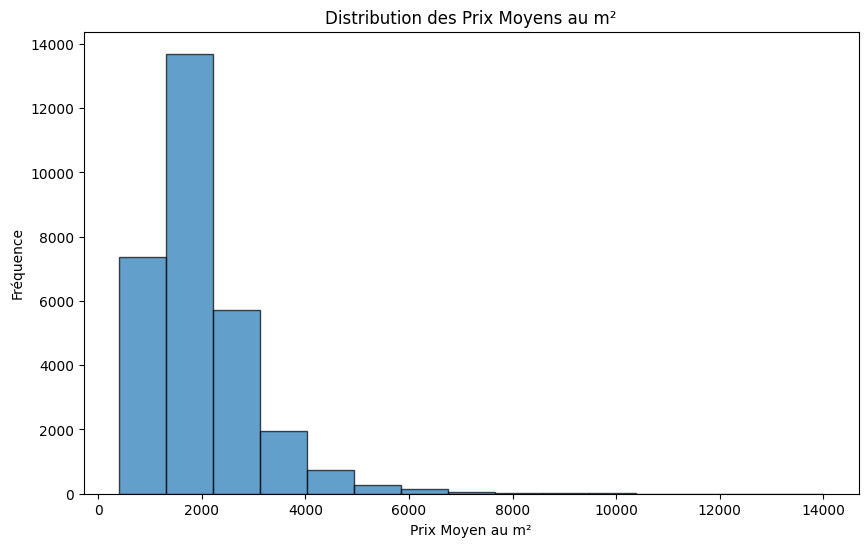

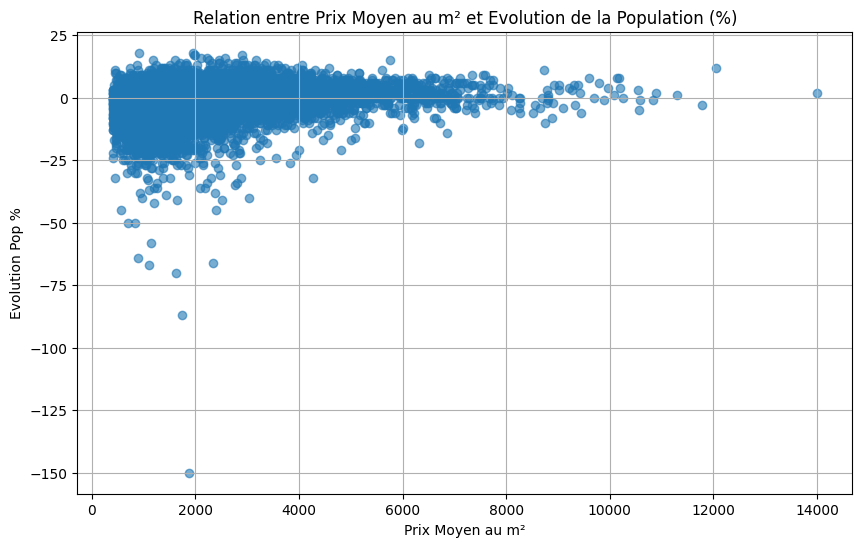

<Figure size 1200x600 with 0 Axes>

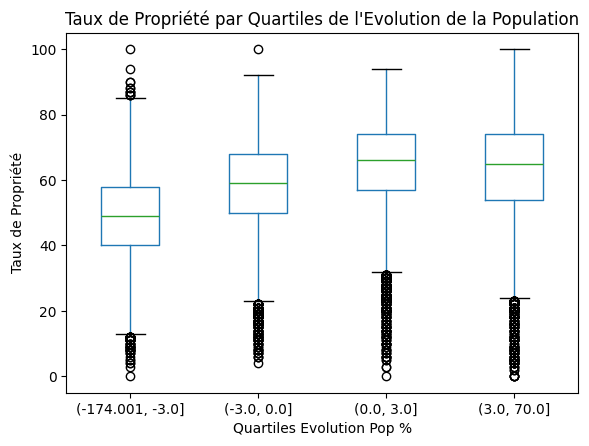

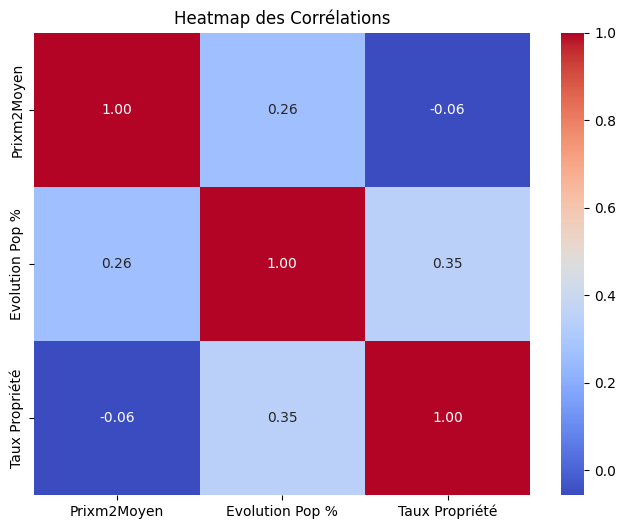

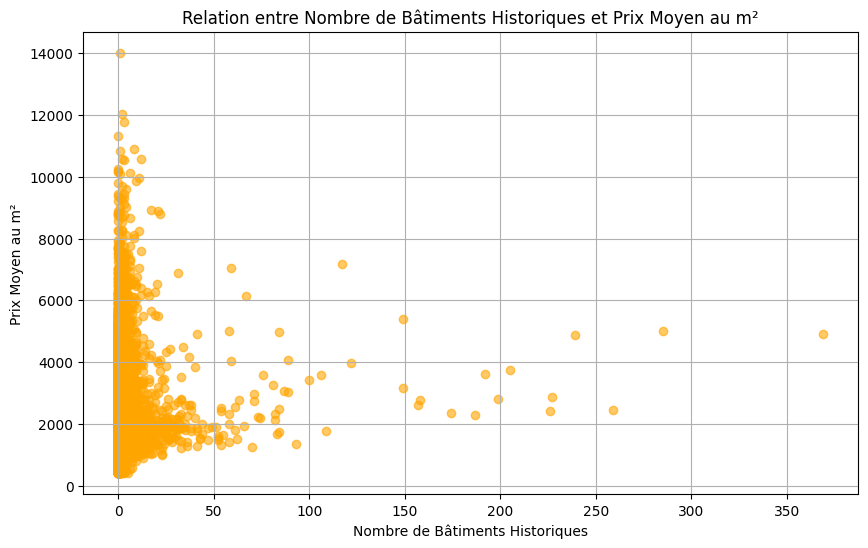

In [ ]:
# Graphique 1 : Répartition des prix moyens au m²
plt.figure(figsize=(10, 6))
plt.hist(df['Prixm2Moyen'], bins=15, alpha=0.7, edgecolor='black')
plt.title('Distribution des Prix Moyens au m²')
plt.xlabel('Prix Moyen au m²')
plt.ylabel('Fréquence')
plt.show()

# Graphique 2 : Corrélation entre Prixm2Moyen et Evolution Pop %
plt.figure(figsize=(10, 6))
plt.scatter(df['Prixm2Moyen'], df['Evolution Pop %'], alpha=0.6)
plt.title('Relation entre Prix Moyen au m² et Evolution de la Population (%)')
plt.xlabel('Prix Moyen au m²')
plt.ylabel('Evolution Pop %')
plt.grid(True)
plt.show()

# Graphique 3 : Boxplot pour Taux Propriété par Evolution Pop % (groupé en intervalles)
df['Evolution Pop % Group'] = pd.qcut(df['Evolution Pop %'], q=4, duplicates='drop')
plt.figure(figsize=(12, 6))
df.boxplot(column='Taux Propriété', by='Evolution Pop % Group', grid=False)
plt.title('Taux de Propriété par Quartiles de l\'Evolution de la Population')
plt.suptitle('')
plt.xlabel('Quartiles Evolution Pop %')
plt.ylabel('Taux de Propriété')
plt.show()

# Graphique 4 : Heatmap des corrélations
import seaborn as sns

correlation_columns = ['Prixm2Moyen', 'Evolution Pop %', 'Taux Propriété']
correlation_matrix = df[correlation_columns].corr()

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Heatmap des Corrélations')
plt.show()

# Graphique 5 : Relation entre le nombre de bâtiments historiques et le prix moyen
plt.figure(figsize=(10, 6))
plt.scatter(df['nombre_batiments_historique'], df['Prixm2Moyen'], alpha=0.6, c='orange')
plt.title('Relation entre Nombre de Bâtiments Historiques et Prix Moyen au m²')
plt.xlabel('Nombre de Bâtiments Historiques')
plt.ylabel('Prix Moyen au m²')
plt.grid(True)
plt.show()

Here we also removed the columns ('CODGEO', 'LIBGEO') that are not necessary for the corelation matrix since they are location indicators. We also removed ('Unnamed: 0', 'Unnamed: 0_x') which are random columns that appeared after our merging

In [12]:
df =df.drop(['CODGEO', 'LIBGEO'], axis = 1)

In [ ]:
df.dtypes

,0
MED14,float64
nombre_batiments_historique,int64
nombre_hopitaux,int64
nombre_crime,int64
nombre_ecole,int64
...,...
Nb de Services aux particuliers,float64
"Nb institution de Education, santé, action sociale, administration",float64
Score Croissance Population,float64
Score Croissance Entrepreneuriale,float64


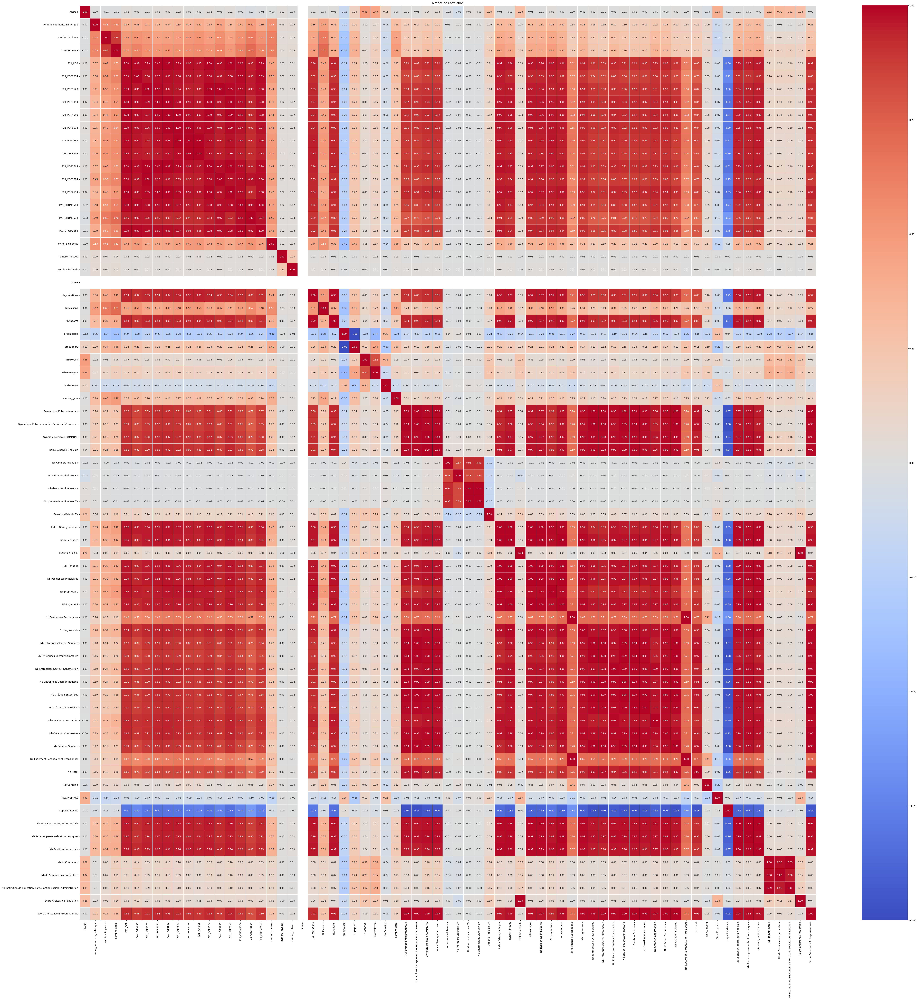

In [ ]:
matrice_correlation = df.corr()

# Visualisation of the corelation matrix
plt.figure(figsize=(70, 70))
sns.heatmap(matrice_correlation, annot=True, cmap='coolwarm', fmt='.2f', linewidths=.5)
plt.title('Matrice de Corrélation')
plt.show()

Let’s analyse our correlation matrix. The bright red represents strong and positive correlation (1) and dark blue represents strong and negative corelation (-1).
For example let’s analyse two of the few correlations we have :

For demographic indicators :


*   Strong Positive Correlation: P21_POP correlates highly with its subcategories (P21_POP0014, P21_POP1529, etc.), indicating internal consistency in population age data.
*   Negative Correlation : P21_POP7589 (older population) negatively correlates with

For real estate and economic factors :
* Strong Positive Correlation : PrixMoyen and Prixm2Moyen are highly correlated, showing consistency between property prices and price per square meter. Dynamique Entrepreneuriale and Nb Entreprises Secteur Services positively correlate, reflecting business activity linked to the service sector.
* Negative Correlation: Taux Propriété negatively correlates with Nb Log Vacants, indicating areas with high homeownership have fewer vacant properties.


In [10]:
X = df.drop(columns=['MED14'])
y = df['MED14']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

numeric_features = X.columns
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features)
    ]
)

models = {
    'Gradient Boosting Regressor': GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, random_state=42),
    'Support Vector Regressor': SVR(kernel='rbf', C=1.0, epsilon=0.1),
    'K-Nearest Neighbors Regressor': KNeighborsRegressor(n_neighbors=5),
    'forest random regressor ' : RandomForestRegressor(n_estimators=100, random_state=42)
}

for name, model in models.items():
    pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('regressor', model)
    ])

    pipeline.fit(X_train, y_train)

    y_pred = pipeline.predict(X_test)

    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f"=== {name} ===")
    print(f"Mean Squared Error (MSE): {mse:.2f}")
    print(f"Root Mean Squared Error (MSE): {np.sqrt(mse):.2f}")
    print(f"R-squared (R²): {r2:.2f}\n")


=== Gradient Boosting Regressor ===
Mean Squared Error (MSE): 2839574.67
Root Mean Squared Error (MSE): 1685.10
R-squared (R²): 0.62

=== Support Vector Regressor ===
Mean Squared Error (MSE): 6564496.68
Root Mean Squared Error (MSE): 2562.13
R-squared (R²): 0.13

=== K-Nearest Neighbors Regressor ===
Mean Squared Error (MSE): 3538584.51
Root Mean Squared Error (MSE): 1881.11
R-squared (R²): 0.53

=== forest random regressor  ===
Mean Squared Error (MSE): 2532277.58
Root Mean Squared Error (MSE): 1591.31
R-squared (R²): 0.66



We applied ML models on the same dataset, but the dataset seems to lack meaningful signal for accurate predictions. Below is the analysis:

- Gradient Boosting Regressor: Errors are relatively high (RMSE: 1699.21) and the variance explained by the model is moderate (R²: 0.62). This model struggles to achieve a strong predictive capability.

- Support Vector Regressor: The results are very poor, with RMSE: 2556.18 and an R² of only 0.13. This suggests that the model is not robust and cannot handle the data's complexity or noise.

- K-Nearest Neighbors Regressor: This model performs consistently with RMSE: 1890.50 and R²: 0.53, showing marginally better results than SVR but still falling short compared to ensemble methods.

- Random Forest Regressor: This model achieves the best results with RMSE: 1612.36 and R²: 0.65, indicating relatively better performance. However, the error values are still high and predictions remain insufficiently accurate.

For stage 2, after getting such poor results, we'll change our focus in order to try different columns to predict on to see in me get more pertinent results with our dataset.

**Stage 2 :**

So in this our target column is not MED14 anymore but : Prixm2Moyen, Evolution Pop %, Taux Propriété.

In [ ]:
colonnes_a_conserver = matrice_correlation['Prixm2Moyen'][abs(matrice_correlation['Prixm2Moyen']) >= 0.3].index

#Creation of a new dataframe with only the columns we want to keep
df_filtré = df[colonnes_a_conserver]

The following code's aim is to obtain the filtered dataframe, we did it to show that we know and can clean a dataset depending on the correlated columns.

Unfortunatly, during the training most of the time the algorithms works better when we provide them with the original dataset (not filtered).

The following code is a proof of that

In this part we are training the model to predic different aspects of each town (mean price of a square meter, population evaluation, property rate) we chose to only work on these targets because after working on others in stage 1, the results where not interesting at all, the errors where too large. **We think that this might be caused by weak correlatin, missing data,or uncertainty in the data quality.**

 We are using differents ML models (Gradient Boosting Regressor, Support Vector Regressor, K-Nearest Neighbors Regressor, forest random regressor). Some were already used in stage 1 and others were added in this stage to broaden our approach and improve performance.

We are also evaluating our preformance with (Mean Squared Error (MSE), Root Mean Squared Error (RMSE),  R-squared (R²)).

In [ ]:
# Preparation of the data
X = df_filtré.drop(columns=['Prixm2Moyen'])
y = df_filtré['Prixm2Moyen']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Pipeline for the tranformation of the numerical columns
numeric_features = X.columns
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),  # Replace missing values by the mean
    ('scaler', StandardScaler())                 # Data normalization
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features)
    ]
)

# Alternatif models
models = {
    'Gradient Boosting Regressor': GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, random_state=42),
    'Support Vector Regressor': SVR(kernel='rbf', C=1.0, epsilon=0.1),
    'K-Nearest Neighbors Regressor': KNeighborsRegressor(n_neighbors=5),
    'forest random regressor ' : RandomForestRegressor(n_estimators=100, random_state=42)
}

# Evaluation of each model
for name, model in models.items():
    pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('regressor', model)
    ])

    # Model training
    pipeline.fit(X_train, y_train)

    # Predictions
    y_pred = pipeline.predict(X_test)

    # Performance evaluation
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f"=== {name} ===")
    print(f"Mean Squared Error (MSE): {mse:.2f}")
    print(f"Root Mean Squared Error (MSE): {np.sqrt(mse):.2f}")
    print(f"R-squared (R²): {r2:.2f}\n")

=== Gradient Boosting Regressor ===
Mean Squared Error (MSE): 171193.35
Root Mean Squared Error (MSE): 413.76
R-squared (R²): 0.79

=== Support Vector Regressor ===
Mean Squared Error (MSE): 423642.60
Root Mean Squared Error (MSE): 650.88
R-squared (R²): 0.49

=== K-Nearest Neighbors Regressor ===
Mean Squared Error (MSE): 202918.08
Root Mean Squared Error (MSE): 450.46
R-squared (R²): 0.75

=== forest random regressor  ===
Mean Squared Error (MSE): 189335.29
Root Mean Squared Error (MSE): 435.13
R-squared (R²): 0.77



In [ ]:
pipeline

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  Index(['MED14', 'propmaison', 'propappart', 'PrixMoyen', 'Nb de Commerce',
       'Nb de Services aux particuliers',
       'Nb institution de Education, santé, action sociale, administration'],
      dtype='object'))])),
                ('regressor', RandomForestRegressor(random_state=42))])

- Gradient Boosting Regresso : The mean squared error is relatively low which indicates that the model preforms well. The RMSE shows an error of 438.42 euros. The R2 shows that 82% of the variance in "Prix2Moyen" is explained by the input variable. These are among the best results across all the models but we think it is not good enough since the error is 438 euros on an average price of 2000 euros.

- Support Vector Regressor : The MSE and RMSE shows that the errors are significantly higher (784 euros of difference). The predictions are far less precise compared to other models. This is possibly due to its sensitivity to hyperparameters.

- K-Nearest Neighbors Regressor : MSE and RMSE errors are relatively low close to those of Gradient Boosting. This indicates that KNN is a good performer but still it is less precise than Gradient Boosting.

- Forest random regressor : This model is as good as the gradient boosting.


Test avec PCA :

In [ ]:
X = df.drop(columns=['Prixm2Moyen'])
y = df['Prixm2Moyen']

pca = PCA(n_components=0.90)


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

numeric_features = X.columns
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features)
    ]
)

models = {
    'Gradient Boosting Regressor': GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, random_state=42),
    'Support Vector Regressor': SVR(kernel='rbf', C=1.0, epsilon=0.1),
    'K-Nearest Neighbors Regressor': KNeighborsRegressor(n_neighbors=5),
    'forest random regressor ' : RandomForestRegressor(n_estimators=100, random_state=42)
}

for name, model in models.items():
    pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('pca', pca),
        ('regressor', model)
    ])

    pipeline.fit(X_train, y_train)

    y_pred = pipeline.predict(X_test)

    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f"=== {name} ===")
    print(f"Mean Squared Error (MSE): {mse:.2f}")
    print(f"Root Mean Squared Error (MSE): {np.sqrt(mse):.2f}")
    print(f"R-squared (R²): {r2:.2f}\n")



=== Gradient Boosting Regressor ===
Mean Squared Error (MSE): 262904.79
Root Mean Squared Error (MSE): 512.74
R-squared (R²): 0.68

=== Support Vector Regressor ===
Mean Squared Error (MSE): 549112.87
Root Mean Squared Error (MSE): 741.02
R-squared (R²): 0.34

=== K-Nearest Neighbors Regressor ===
Mean Squared Error (MSE): 264041.69
Root Mean Squared Error (MSE): 513.85
R-squared (R²): 0.68

=== forest random regressor  ===
Mean Squared Error (MSE): 219715.26
Root Mean Squared Error (MSE): 468.74
R-squared (R²): 0.73



We retried the same ML models on the same dataset to predict the real estate price per square meter by municipality, and here are the results:

- Gradient Boosting Regressor: Errors are relatively low (RMSE: 512.74), and the variance explained by the model is good (R²: 0.68). The model performs well but leaves room for improvement in prediction accuracy.

- Support Vector Regressor: The results are poor, with RMSE: 741.02 and an R² of only 0.34, indicating that the model is not well-suited for this task or struggles with the data structure.

- K-Nearest Neighbors Regressor: This model performs similarly to Gradient Boosting with RMSE: 513.85 and R²: 0.68, suggesting it captures the data patterns reasonably well.

- Random Forest Regressor: This model achieves the best results with RMSE: 468.74 and R²: 0.73, indicating a strong predictive capability and high accuracy compared to the other models.

In [ ]:
X = df.drop(columns=['Prixm2Moyen'])
y = df['Prixm2Moyen']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

numeric_features = X.columns
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features)
    ]
)

models = {
    'Gradient Boosting Regressor': GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, random_state=42),
    'Support Vector Regressor': SVR(kernel='rbf', C=1.0, epsilon=0.1),
    'K-Nearest Neighbors Regressor': KNeighborsRegressor(n_neighbors=5),
    'forest random regressor ' : RandomForestRegressor(n_estimators=100, random_state=42)
}

for name, model in models.items():
    pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('regressor', model)
    ])

    pipeline.fit(X_train, y_train)

    y_pred = pipeline.predict(X_test)

    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f"=== {name} ===")
    print(f"Mean Squared Error (MSE): {mse:.2f}")
    print(f"Root Mean Squared Error (MSE): {np.sqrt(mse):.2f}")
    print(f"R-squared (R²): {r2:.2f}\n")



=== Gradient Boosting Regressor ===
Mean Squared Error (MSE): 29051.79
Root Mean Squared Error (MSE): 170.45
R-squared (R²): 0.96

=== Support Vector Regressor ===
Mean Squared Error (MSE): 479927.02
Root Mean Squared Error (MSE): 692.77
R-squared (R²): 0.42

=== K-Nearest Neighbors Regressor ===
Mean Squared Error (MSE): 159837.44
Root Mean Squared Error (MSE): 399.80
R-squared (R²): 0.81

=== forest random regressor  ===
Mean Squared Error (MSE): 29861.43
Root Mean Squared Error (MSE): 172.80
R-squared (R²): 0.96



We retried the same ML models on the same dataset, but this time the dataset was not filtered by correlation. And we have much better results (we don't understand why, maybe we lost a lot of important data after filtering).

- Gradient Boosting Regressor : Errors are significaly lower than before (170,50 euros) and predicitons are much more accurate (96% of the variance is explained in the target variable). Gradient boosting benefits significantly from the additional information in the unfiltered dataset

- Support Vector Regressor : The results are even worse than before this model is performing very poorly. This could inidcate that the model is not robust to noisy or uncorrelated data.

- K-Nearest Neighbors Regressor : KNN is performing the same way as before it is relatively stable. We can see a marginal improvement. However, Gradient Boosting and Random Forest are still much more accurate.

- forest random regressor : Massive improvment with an error of 173.71 RMSE compared to 468.74 before. And an R2 of 0.96 indicated highly accurate results. Like gradient boosting this model benefits significantly from the unfiltered datasets using the adidtional data to improve predictions.







In [ ]:
y

,Prixm2Moyen
0,2249.500000
1,1913.500000
2,2399.620253
3,3287.962963
4,1975.924278
5,2274.871795
6,2538.800000
7,1862.666667
8,2795.944444
9,2210.800000


we print the y to have some information to compare the evaluation of our models to it.



In [ ]:
X = df.drop(columns=['Evolution Pop %'])
y = df['Evolution Pop %']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

numeric_features = X.columns
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features)
    ]
)

models = {
    'Gradient Boosting Regressor': GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, random_state=42),
    'Support Vector Regressor': SVR(kernel='rbf', C=1.0, epsilon=0.1),
    'K-Nearest Neighbors Regressor': KNeighborsRegressor(n_neighbors=5),
    'forest random regressor ' : RandomForestRegressor(n_estimators=100, random_state=42)
}

for name, model in models.items():
    pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('regressor', model)
    ])

    pipeline.fit(X_train, y_train)

    y_pred = pipeline.predict(X_test)

    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f"=== {name} ===")
    print(f"Mean Squared Error (MSE): {mse:.2f}")
    print(f"Root Mean Squared Error (MSE): {np.sqrt(mse):.2f}")
    print(f"R-squared (R²): {r2:.2f}\n")


=== Gradient Boosting Regressor ===
Mean Squared Error (MSE): 2.07
Root Mean Squared Error (MSE): 1.44
R-squared (R²): 0.94

=== Support Vector Regressor ===
Mean Squared Error (MSE): 7.90
Root Mean Squared Error (MSE): 2.81
R-squared (R²): 0.77

=== K-Nearest Neighbors Regressor ===
Mean Squared Error (MSE): 5.56
Root Mean Squared Error (MSE): 2.36
R-squared (R²): 0.84

=== forest random regressor  ===
Mean Squared Error (MSE): 2.37
Root Mean Squared Error (MSE): 1.54
R-squared (R²): 0.93



We retried the same ML models on the same dataset to predict population growth, and here are the results:

- Gradient Boosting Regressor: Errors are very low (RMSE: 1.44), and the variance explained by the model is excellent (R²: 0.94). This model performs exceptionally well, providing highly accurate predictions.

- Support Vector Regressor: The results are weaker, with RMSE: 2.81 and R²: 0.77, indicating that this model struggles compared to the others but still captures some of the patterns.

- K-Nearest Neighbors Regressor: This model achieves moderate results with RMSE: 2.36 and R²: 0.84, showing better performance than Support Vector Regressor but less accuracy than Gradient Boosting and Random Forest.

- Random Forest Regressor: This model performs almost as well as Gradient Boosting, with RMSE: 1.54 and R²: 0.93, making it a strong candidate for accurate predictions.

Calculating the distribuation of the target values so we can understand our results :




In [ ]:
# Préparation des données
X = df.drop(columns=['Taux Propriété'])
y = df['Taux Propriété']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Pipeline pour les transformations des colonnes numériques
numeric_features = X.columns
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),  # Remplace les valeurs manquantes par la moyenne
    ('scaler', StandardScaler())                 # Normalisation des données
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features)
    ]
)

# Modèles alternatifs
models = {
    'Gradient Boosting Regressor': GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, random_state=42),
    'Support Vector Regressor': SVR(kernel='rbf', C=1.0, epsilon=0.1),
    'K-Nearest Neighbors Regressor': KNeighborsRegressor(n_neighbors=5),
    'forest random regressor ' : RandomForestRegressor(n_estimators=100, random_state=42)
}

# Évaluer chaque modèle
for name, model in models.items():
    pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('regressor', model)
    ])

    # Entraîner le modèle
    pipeline.fit(X_train, y_train)

    # Faire des prédictions
    y_pred = pipeline.predict(X_test)

    # Évaluer les performances
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f"=== {name} ===")
    print(f"Mean Squared Error (MSE): {mse:.2f}")
    print(f"Root Mean Squared Error (MSE): {np.sqrt(mse):.2f}")
    print(f"R-squared (R²): {r2:.2f}\n")


=== Gradient Boosting Regressor ===
Mean Squared Error (MSE): 28.17
Root Mean Squared Error (MSE): 5.31
R-squared (R²): 0.88

=== Support Vector Regressor ===
Mean Squared Error (MSE): 100.22
Root Mean Squared Error (MSE): 10.01
R-squared (R²): 0.56

=== K-Nearest Neighbors Regressor ===
Mean Squared Error (MSE): 110.91
Root Mean Squared Error (MSE): 10.53
R-squared (R²): 0.51

=== forest random regressor  ===
Mean Squared Error (MSE): 14.56
Root Mean Squared Error (MSE): 3.82
R-squared (R²): 0.94



We retried the same ML models on the same dataset to predict the ownership rate, and here are the results:

- Gradient Boosting Regressor: Errors are relatively low (RMSE: 5.31), and the variance explained by the model is high (R²: 0.88). This model performs well, providing accurate predictions.

- Support Vector Regressor: The results are poor, with RMSE: 10.01 and R²: 0.56, indicating that this model struggles significantly to make accurate predictions.

- K-Nearest Neighbors Regressor: This model performs the worst, with RMSE: 10.53 and R²: 0.51, suggesting it is unable to capture the underlying data patterns effectively.

- Random Forest Regressor: This model achieves the best results, with RMSE: 3.82 and R²: 0.94, demonstrating excellent predictive capability and highly accurate results.

In [ ]:
y

,Taux Propriété
0,67.00000
1,42.00000
2,37.00000
3,68.00000
4,49.00000
5,66.00000
6,65.00000
7,72.00000
8,53.00000
9,55.00000


#STAGE 3

#REGMIXUP

Regmixup is a variant technique of the original mixup sara augmentation method adapted for regression tasks.
The goal is to create new training examples that can help the model learn to interpolate between examples and prevent overfitting.
How does it work ?
- Shuffle the data ann selec pairs of examples
- Sample the distribution and determine how much influence each of the original paired examples has on the mixed example.
- Creating mixed examples and handeling nan if they appear by replacing them with the mean value of the original data.

Benefits :
- improved robustness (the model stops focusing on specific data points)
- better generelization
- regularization effect (reducing overfitting by mixing examples which augments the data).


In [ ]:
import numpy as np
from scipy.stats import beta
import pandas as pd

def regmixup_data(X, y, alpha=0.2):
    """
    Applies RegMixup augmentation to the regression data.

    Args:
        X (pd.DataFrame): Feature data.
        y (pd.Series): Target variable.
        alpha (float): Hyperparameter for the Beta distribution, controlling the degree of mixing.

    Returns:
        pd.DataFrame, pd.Series: Mixed feature data and target variables.
    """
    if alpha > 0:
        lam = beta(alpha, alpha).rvs()
    else:
        lam = 1  # No mixing, direct data

    indices = np.random.permutation(X.index)

    X_mixup = lam * X + (1 - lam) * X.loc[indices].reset_index(drop=True)
    y_mixup = lam * y + (1 - lam) * y.loc[indices].reset_index(drop=True)

    # Check for NaNs and handle if necessary
    if X_mixup.isnull().any().any() or y_mixup.isnull().any():
        X_mixup.fillna(X.mean(), inplace=True)  # Fill NaNs with the mean of original data
        y_mixup.fillna(y.mean(), inplace=True)  # Fill NaNs with the mean of original data

    return X_mixup, y_mixup


In [ ]:
X = df.drop(columns=['Prixm2Moyen'])
y = df['Prixm2Moyen']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

numeric_features = X.columns
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features)
    ]
)

X_train_mixup, y_train_mixup = regmixup_data(X_train, y_train)

models = {
    'Gradient Boosting Regressor': GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, random_state=42),
    'Support Vector Regressor': SVR(kernel='rbf', C=1.0, epsilon=0.1),
    'K-Nearest Neighbors Regressor': KNeighborsRegressor(n_neighbors=5),
    'forest random regressor ' : RandomForestRegressor(n_estimators=100, random_state=42)
}

for name, model in models.items():
    pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('regressor', model)
    ])

    pipeline.fit(X_train_mixup, y_train_mixup)

    y_pred = pipeline.predict(X_test)

    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f"=== {name} ===")
    print(f"Mean Squared Error (MSE): {mse:.2f}")
    print(f"Root Mean Squared Error (MSE): {np.sqrt(mse):.2f}")
    print(f"R-squared (R²): {r2:.2f}\n")

=== Gradient Boosting Regressor ===
Mean Squared Error (MSE): 29977.88
Root Mean Squared Error (MSE): 173.14
R-squared (R²): 0.96

=== Support Vector Regressor ===
Mean Squared Error (MSE): 562506.00
Root Mean Squared Error (MSE): 750.00
R-squared (R²): 0.32

=== K-Nearest Neighbors Regressor ===
Mean Squared Error (MSE): 192318.00
Root Mean Squared Error (MSE): 438.54
R-squared (R²): 0.77

=== forest random regressor  ===
Mean Squared Error (MSE): 36751.35
Root Mean Squared Error (MSE): 191.71
R-squared (R²): 0.96



Comparing result with and without regmixup we can observe :

- The performance of the gradient boosting regression is very similar with and without regmixup.
- The support Vector Regressor shows a noticeable degradation in performance with regmixup.
Both MSE and RMSE increased significantly and the R2 decreased indicating less model fit to the data.
- The KNN shows worse performance when using regmixup. It exhibits increases in MSE and RMSE along with a decrease in R2 showing that the regmixup might be detracting from the model's ability to capture the local nuance of the data.
- Similar to Gradient Boosting Regressor, the overall prediction remains similar and robust.

In summary Tree-Based Models handle the introduction of new data through regmixup better than the other models.
Non-Tree-Based Models are negatively impacted by regmixup showing worse accuracy.

We should reconsider using regmixup with our models...


#Vote proportionnelle en fonction du R^2

In [ ]:

X = df.drop(columns=['Prixm2Moyen'])
y = df['Prixm2Moyen']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

numeric_features = X.columns
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features)
    ]
)

models = {
    'Gradient Boosting Regressor': GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, random_state=42),

    'forest random regressor ' : RandomForestRegressor(n_estimators=100, random_state=42)
}

predictions = []
model_weights = []

for name, model in models.items():
    pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('regressor', model)
    ])

    pipeline.fit(X_train, y_train)

    y_pred = pipeline.predict(X_test)

    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f"=== {name} ===")
    print(f"Mean Squared Error (MSE): {mse:.2f}")
    print(f"Root Mean Squared Error (MSE): {np.sqrt(mse):.2f}")
    print(f"R-squared (R²): {r2:.2f}\n")
    predictions.append(y_pred)
    model_weights.append(r2 if r2 > 0 else 0)  # Ignorer les scores R² négatifs


=== Gradient Boosting Regressor ===
Mean Squared Error (MSE): 29051.79
Root Mean Squared Error (MSE): 170.45
R-squared (R²): 0.96

=== forest random regressor  ===
Mean Squared Error (MSE): 29861.43
Root Mean Squared Error (MSE): 172.80
R-squared (R²): 0.96



In [ ]:
# Calcul de la prédiction pondérée
predictions = np.array(predictions)
model_weights = np.array(model_weights)

if model_weights.sum() > 0:
    # Normalisation des poids
    normalized_weights = model_weights / model_weights.sum()
    # Prédiction finale pondérée
    final_prediction = np.average(predictions, axis=0, weights=normalized_weights)
else:
    # Si tous les scores R² sont négatifs, on utilise une moyenne simple
    final_prediction = predictions.mean(axis=0)


final_mse = mean_squared_error(y_test, final_prediction)
final_r2 = r2_score(y_test, final_prediction)

print("=== Final Weighted Prediction ===")
print(f"Mean Squared Error (MSE): {final_mse:.2f}")
print(f"Root Mean Squared Error (MSE): {np.sqrt(final_mse):.2f}")
print(f"R-squared (R²): {final_r2:.2f}")


=== Final Weighted Prediction ===
Mean Squared Error (MSE): 27979.88
Root Mean Squared Error (MSE): 167.27
R-squared (R²): 0.97


In this code, proportional voting is used to combine predictions from multiple regression models. Each model provides a prediction, and these predictions are weighted based on their respective performances, measured by the \( R^2 \) score.

This approach allows us to achieve better results with an RMSE of 167.27 and an \( R^2 \) of 0.97. However, the initial results were already very high, making the improvement in prediction performance almost negligible.

Nevertheless, it is worth noting that combining two performant models can further enhance predictions.

# Hyperparametres modifications

To refine our approach, we took the decision to try different sets of hyperparametres when defining our models, so that we would determine which hyperparameters have the most impact on our MSE and R² an why.

In [4]:
# Setup code
# Chargement des données
df = pd.read_csv("df_communes_avec_Nan.csv")

# Gestion des valeurs manquantes
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns
numeric_imputer = SimpleImputer(strategy='mean')
df[numerical_columns] = numeric_imputer.fit_transform(df[numerical_columns])
df = df.drop(['CODGEO', 'LIBGEO'], axis=1)

# Séparation des variables explicatives et cible
X = df.drop(columns=['Prixm2Moyen'])
y = df['Prixm2Moyen']

# Split des données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Prétraitement des données
numeric_features = X.columns
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features)
    ]
)

<ipython-input-4-fa86dacedfcc>:3: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("df_communes_avec_Nan.csv")


In [ ]:
# Here is the code with the original hyperparametres :
models = {
    'Gradient Boosting Regressor': GradientBoostingRegressor(
        n_estimators=150, learning_rate=0.05, max_depth=5, subsample=0.8, random_state=42
    ),
    'Support Vector Regressor': SVR(
        kernel='rbf', C=10.0, epsilon=0.2
    ),
    'K-Nearest Neighbors Regressor': KNeighborsRegressor(
        n_neighbors=10, weights='distance'
    ),
    'Random Forest Regressor': RandomForestRegressor(
        n_estimators=150, max_depth=10, max_features='sqrt', min_samples_split=5, random_state=42
    )
}

# Training and evaluation
results = []
for name, model in models.items():
    pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('regressor', model)
    ])

    # Validation croisée pour détecter l'overfitting
    #cv_scores = cross_val_score(pipeline, X_train, y_train, cv=5, scoring='r2')
    pipeline.fit(X_train, y_train)

    # Prédictions sur l'ensemble de test
    y_pred = pipeline.predict(X_test)

    # Calcul des métriques
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    # Stockage des résultats

    results.append({
        'Model': name,
        #'CV R² Mean': np.mean(cv_scores),
        #'CV R² Std': np.std(cv_scores),
        'Test R²': r2,
        'Test MSE': mse
    })

    # Affichage des résultats
    print(f"=== {name} ===")
   # print(f"Cross-Validation R²: {np.mean(cv_scores):.2f} ± {np.std(cv_scores):.2f}")
    print(f"Test R²: {r2:.2f}")
    print(f"Test Mean Squared Error (MSE): {mse:.2f}")
    print(f"Test Root Mean Squared Error (RMSE): {np.sqrt(mse):.2f}\n")

# Résultats sous forme de tableau
results_df = pd.DataFrame(results)
results_df.sort_values(by='Test R²', ascending=False, inplace=True)
print("=== Résultats globaux ===")
print(results_df)

=== Gradient Boosting Regressor ===
Test R²: 0.97
Test Mean Squared Error (MSE): 27483.06
Test Root Mean Squared Error (RMSE): 165.78

=== Support Vector Regressor ===
Test R²: 0.74
Test Mean Squared Error (MSE): 210994.24
Test Root Mean Squared Error (RMSE): 459.34

=== K-Nearest Neighbors Regressor ===
Test R²: 0.79
Test Mean Squared Error (MSE): 175621.55
Test Root Mean Squared Error (RMSE): 419.07

=== Random Forest Regressor ===
Test R²: 0.78
Test Mean Squared Error (MSE): 180424.69
Test Root Mean Squared Error (RMSE): 424.76

=== Résultats globaux ===
                           Model   Test R²       Test MSE
0    Gradient Boosting Regressor  0.966721   27483.062894
2  K-Nearest Neighbors Regressor  0.787341  175621.549355
3        Random Forest Regressor  0.781525  180424.692618
1       Support Vector Regressor  0.744509  210994.238393


And here is the same approach but with different hyperparametres

In [ ]:
# Here is the code with the ajusted hyperparameters
models = {
    'Gradient Boosting Regressor': GradientBoostingRegressor(
        n_estimators=300, learning_rate=0.01, max_depth=5, subsample=0.8, random_state=42
    ),
    'Support Vector Regressor': SVR(
        kernel='rbf', C=100.0, epsilon=0.5
    ),
    'K-Nearest Neighbors Regressor': KNeighborsRegressor(
        n_neighbors=5, weights='distance'
    ),
    'Random Forest Regressor': RandomForestRegressor(
        n_estimators=100, max_depth=10, max_features='sqrt', min_samples_split=10, random_state=42
    )
}

# Training and evaluation
results = []
for name, model in models.items():
    pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('regressor', model)
    ])

    # Validation croisée pour détecter l'overfitting
    #cv_scores = cross_val_score(pipeline, X_train, y_train, cv=5, scoring='r2')
    pipeline.fit(X_train, y_train)

    # Prédictions sur l'ensemble de test
    y_pred = pipeline.predict(X_test)

    # Calcul des métriques
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    # Stockage des résultats

    results.append({
        'Model': name,
        #'CV R² Mean': np.mean(cv_scores),
        #'CV R² Std': np.std(cv_scores),
        'Test R²': r2,
        'Test MSE': mse
    })

    # Affichage des résultats
    print(f"=== {name} ===")
   # print(f"Cross-Validation R²: {np.mean(cv_scores):.2f} ± {np.std(cv_scores):.2f}")
    print(f"Test R²: {r2:.2f}")
    print(f"Test Mean Squared Error (MSE): {mse:.2f}")
    print(f"Test Root Mean Squared Error (RMSE): {np.sqrt(mse):.2f}\n")

# Résultats sous forme de tableau
results_df = pd.DataFrame(results)
results_df.sort_values(by='Test R²', ascending=False, inplace=True)
print("=== Résultats globaux ===")
print(results_df)

=== Gradient Boosting Regressor ===
Test R²: 0.96
Test Mean Squared Error (MSE): 33337.08
Test Root Mean Squared Error (RMSE): 182.58

=== Support Vector Regressor ===
Test R²: 0.85
Test Mean Squared Error (MSE): 120277.50
Test Root Mean Squared Error (RMSE): 346.81

=== K-Nearest Neighbors Regressor ===
Test R²: 0.79
Test Mean Squared Error (MSE): 172488.89
Test Root Mean Squared Error (RMSE): 415.32

=== Random Forest Regressor ===
Test R²: 0.77
Test Mean Squared Error (MSE): 190612.21
Test Root Mean Squared Error (RMSE): 436.59

=== Résultats globaux ===
                           Model   Test R²       Test MSE
0    Gradient Boosting Regressor  0.959632   33337.078743
1       Support Vector Regressor  0.854357  120277.498957
2  K-Nearest Neighbors Regressor  0.791135  172488.890133
3        Random Forest Regressor  0.769189  190612.214968


After the modifications of the hyperparametres, we notice a few things :

- For the Gradient Boosting Regressor, the original hyperparametres indicate that there is a chance we could be overlearning (R²>>0.95). Reducing the learning rate meant that we had to augment the amount of trees by increasing n_estimators, which lead to a slightly more stable R² but a higher MSE. We can't necessarily conclude that these changes are for the better, but they at least have more chances to avoid overlearning.

- For the Support Vector Regressor, augmenting the value of C (the tolerance for errors) from 10 to 100 managed to drastically improve the results, giving a much better R² and MSE than before.
The changes to the value of epsilon also had some impact, but it was very slight compared to that of C.

- As for the K-Nearest Neighbors Regressor, reducing the amount of neighbours helped better the margins of R² and MSE, since the data was less smoothed over. Changing the weights from uniform to distance did not seem to impact the results all that much, so we decided to keep distance as the better hyperparameter.

- Finally, for the Random Forest Generator, we instead reduced the amount of trees, and augmented the value of min_samples_split, reducing the complexity of our model. These changes were for the better, although the difference isn't massive and this model remains far behind the others in terms of margins regarding the R² and MSE.


#XGBoost

In [8]:

# Séparation des variables explicatives et ciblefrom xgboost import XGBRegressor
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split, cross_val_score


X = df.drop(columns=['Prixm2Moyen'])
y = df['Prixm2Moyen']

# Split des données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Prétraitement des données
numeric_features = X.columns
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features)
    ]
)

# Définition des modèles avec des hyperparamètres ajustés
models = {

    'XGBoost Regressor': XGBRegressor(
        n_estimators=200, learning_rate=0.1, max_depth=6, subsample=0.8, colsample_bytree=0.8, random_state=42
    )
}

# Entraînement et évaluation
results = []
for name, model in models.items():
    pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('regressor', model)
    ])

    # Validation croisée pour détecter l'overfitting
    cv_scores = cross_val_score(pipeline, X_train, y_train, cv=5, scoring='r2')
    pipeline.fit(X_train, y_train)

    # Prédictions sur l'ensemble de test
    y_pred = pipeline.predict(X_test)

    # Calcul des métriques
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    # Stockage des résultats
    results.append({
        'Model': name,
        'CV R² Mean': np.mean(cv_scores),
        'CV R² Std': np.std(cv_scores),
        'Test R²': r2,
        'Test MSE': mse
    })

    # Affichage des résultats
    print(f"=== {name} ===")
    print(f"Cross-Validation R²: {np.mean(cv_scores):.2f} ± {np.std(cv_scores):.2f}")
    print(f"Test R²: {r2:.2f}")
    print(f"Test Mean Squared Error (MSE): {mse:.2f}")
    print(f"Test Root Mean Squared Error (RMSE): {np.sqrt(mse):.2f}\n")

# Résultats sous forme de tableau
results_df = pd.DataFrame(results)
results_df.sort_values(by='Test R²', ascending=False, inplace=True)
print("=== Résultats globaux ===")
print(results_df)

=== XGBoost Regressor ===
Cross-Validation R²: 0.96 ± 0.01
Test R²: 0.96
Test Mean Squared Error (MSE): 33836.86
Test Root Mean Squared Error (RMSE): 183.95

=== Résultats globaux ===
               Model  CV R² Mean  CV R² Std   Test R²      Test MSE
0  XGBoost Regressor    0.957693   0.007195  0.959027  33836.856251


With XGBoost, we also achieve good results. More explanations are provided in the conclusion.

#Conclusion

##Stage 1 :

In this stage, our main goal was to create our own database, to try to find links between our indicators and to start applying Machine Learning to it.

First, we gathered the data we needed, cleaned it, and kept the values that mattered for this project before merging the 14 datasets into one.

Our goal was to predict the level/quality of life for each town, specifically how much one inhabitant was making per year on average. We used a dataset that mentioned this indicator, measured in 2014.

We applied several machine learning models to predict this indicator, referred to as "Med14". Unfortunately, the results were not as accurate as we hoped. Even the best-performing models, such as Gradient Boosting Regressor and Random Forest Regressor, only explained a moderate portion of the variance and had relatively high prediction errors. This suggests that either the dataset lacks strong predictive signals for this indicator or that further refinement of the feature engineering and preprocessing steps is necessary.

As Med14 does not provide sufficient predictive power, our next step is to explore different columns in the dataset that we can predict, such as population growth, real estate price per square meter, or ownership rate. By identifying new target variables with stronger correlations to the existing data, we aim to improve model performance and focusn our annalysis on one prediction that will be more reliable and effective.

## Stage 2 :

In the second part of our project, we shifted our focus to exploring other target variables to predict, as the Med14 predictions did not provide satisfactory results. We analyzed the performance of various machine learning models on new indicators such as population growth, ownership rate, or even real estate price per square meter.

The results showed significant variation in model performance depending on the target variable. While predictions for population growth and ownership rate yielded good results with models like Random Forest and Gradient Boosting Regressor (achieving R² scores as high as 0.93 and 0.94), the predictions for the real estate price per square meter consistently outperformed the others. This target provided strong predictive power with lower error metrics and high R² values, indicating that it is well-suited for our dataset.

Given these findings, we have decided to focus exclusively on the prediction of the price per square meter in the next phase of our project. This choice will allow us to build more accurate models and derive actionable insights from our data.

## Stage 3



In this Stage 3, we explored new methods.
The first one, hyperparameter tuning, was interesting to explore, even though it did not yield significantly better results.

Next, the use of RegMixup also provided some interesting insights, but without adding much value overall.

Finally, weighting the R² of the two algorithms resulted in a better RMSE, which, in our case, translates to only a few euros. This is not very significant.
These results can be explained by the fact that our initial results were already very good.


###Scientific study

Why did we chose XGboost ?

We found a scientific paper : https://arxiv.org/pdf/2402.04082

This study, called an "An Optimal House Price Prediction Algorithm: XGBoost" by Hemlata Sharma, Hitesh Harsora, and Bayode Ogunleye (2024) demonstrates the effectiveness of XGBoost in predicting housing prices. The researchers compared multiple machine learning algorithms, including support vector regressor, random forest regressor, multilayer perceptron, and multiple linear regression, using the Ames City housing dataset from Iowa, USA. Their findings indicate that XGBoost outperformed the other models in terms of prediction accuracy.

While this study focuses on data from the United States, its methodology and results are applicable to housing markets in other regions, such as France. The success of XGBoost in capturing complex relationships between housing features and prices suggests it would be a suitable choice for our project on predicting price per square meter in French housing.

#Tableau récapitulatif finale 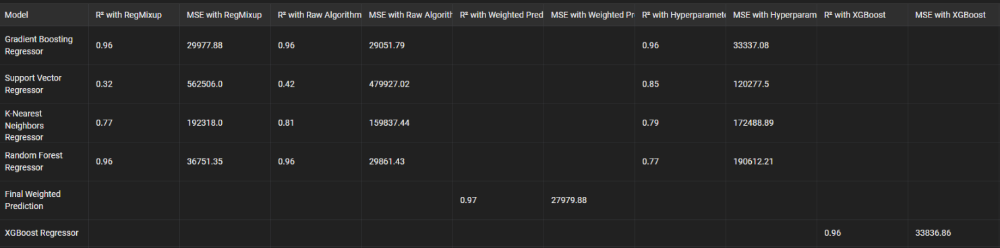